In [1]:
import scimap as sm
import numpy as np
import anndata as ad
import pandas as pd
import scanpy as sc
import scipy as sp
import os
import sys
import yaml
from pathlib import Path
from collections import OrderedDict
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import rcParams
from matplotlib import colormaps
from matplotlib.lines import Line2D
import seaborn as sns
from scipy.ndimage import gaussian_filter, binary_fill_holes, distance_transform_edt
from skimage import measure, morphology
from skimage.filters import threshold_otsu
from skimage.segmentation import find_boundaries
from shapely.geometry import Polygon
from shapely.geometry import Point
sys.path.append(os.path.abspath(".."))
rcParams['font.family'] = 'Arial'
from utils import extract_all_tumor_cores_otsu, extract_interaction

Running SCIMAP  2.2.11


/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/mpl_scatter_density/__init__.py:4: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [2]:
with open("../config.yaml", "r") as f:
    config = yaml.safe_load(f)

# Set up directories
results_dir = Path(config['results_dir'])
metadata_dir = Path(config['metadata_dir'])

In [3]:
# Load both adata and adata_unified 
adata = ad.read(results_dir / 'adata.h5ad')
adata_unified = ad.read(results_dir / "adata_unified.h5ad")

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning:

`anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning:

`anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.



In [4]:
##get the color scheme
conditions = [
    adata.obs['cell_type'] == 'CD4+_T_cells',
    adata.obs['cell_type'] == 'CD8+_T_cells',
    adata.obs['cell_type'] == "Treg_T_cells",
    adata.obs['cell_type'] == 'NK_cells',
    adata.obs['cell_type'] == "M1_macrophages",
    adata.obs['cell_type'] == "M2_macrophages",
    adata.obs['cell_type'] == "M1_M2_macrophages",
    adata.obs['cell_type'] == "B_cells",
    adata.obs['cell_type'] == 'Plasma_cells',
    adata.obs['cell_type'] == 'DCs',
    adata.obs['cell_type'] == 'Granulocytes',
    adata.obs['cell_type'] == 'Mast_cells',
    adata.obs['cell_type'] == 'MDSCs',
    adata.obs['cell_type'] == 'Lymphatic_endothelial_cells',
    adata.obs['cell_type'] == 'Endothelial_cells',
    adata.obs['cell_type'] == 'Actin+_cells',
    adata.obs['cell_type'] == 'Tumor_cells',
    adata.obs['cell_type'] == 'Epithelial_cells',
    adata.obs['cell_type'] == 'NFC'
]

# Define the corresponding labels
labels = [
    'CD4+ T cells',
    'CD8+ T cells',
    'Treg cells',
    'NK cells',
    'M1 macrophages',
    'M2 macrophages',
    'M1/M2 macrophages',
    'B cells',
    'PCs',
    'DCs',
    'Granulocytes',
    'Mast cells',
    'MDSCs',
    'Lymphatic endothelial cells',
    'Endothelial cells',
    'Actin+ cells',
    'Tumor cells',
    'Epithelial cells',
    'NFC'
]

#using np.select
adata.obs['cell_category'] = np.select(conditions, labels, default='Other')

# now for adata_unified 
conditions = [
    adata_unified.obs['cell_type'] == 'CD4+_T_cells',
    adata_unified.obs['cell_type'] == 'CD8+_T_cells',
    adata_unified.obs['cell_type'] == "Treg_T_cells",
    adata_unified.obs['cell_type'] == 'NK_cells',
    adata_unified.obs['cell_type'] == "M1_macrophages",
    adata_unified.obs['cell_type'] == "M2_macrophages",
    adata_unified.obs['cell_type'] == "M1_M2_macrophages",
    adata_unified.obs['cell_type'] == "B_cells",
    adata_unified.obs['cell_type'] == 'Plasma_cells',
    adata_unified.obs['cell_type'] == 'DCs',
    adata_unified.obs['cell_type'] == 'Granulocytes',
    adata_unified.obs['cell_type'] == 'Mast_cells',
    adata_unified.obs['cell_type'] == 'MDSCs',
    adata_unified.obs['cell_type'] == 'Lymphatic_endothelial_cells',
    adata_unified.obs['cell_type'] == 'Endothelial_cells',
    adata_unified.obs['cell_type'] == 'Actin+_cells',
    adata_unified.obs['cell_type'] == 'Tumor_cells',
    adata_unified.obs['cell_type'] == 'Epithelial_cells',
    adata_unified.obs['cell_type'] == 'NFC'
]

adata_unified.obs['cell_category'] = np.select(conditions, labels, default='Other')



cell_category_color = {
    "Actin+ cells": "#AAAAFF",
    "B cells": "#FFFF00",
    "DCs": "#00FF00",
    "Endothelial cells": "#55FFFF",
    "Granulocytes": "#FF00FF",
    "Lymphatic endothelial cells": "#0055FF",
    "Mast cells": "#AA007F",
    "MDSCs": "#00007F",
    "NFC": "#A9A9A9",
    "NK cells": "#00AAFF",
    "PCs": "#FFFF7F",
    "CD4+ T cells": "#0055FF",
    "CD8+ T cells": "#FF0000",
    "Treg cells": "#AAFF7F",
    "Tumor cells": "#555555",
    "Epithelial cells": "#FFCC99",
    "M1 macrophages": "#00557F",
    "M2 macrophages": "#00AA7F",
    "M1/M2 macrophages": "#007F7F",
}

myeloid_color = {
    "DCs": "#00FF00",
    "Granulocytes": "#FF00FF",
    "Mast cells": "#AA007F",
    "MDSCs": "#00007F",
    "M1 macrophages": "#00557F",
    "M2 macrophages": "#00AA7F",
    "M1/M2 macrophages": "#007F7F",
}

lymphoid_color = {
    "B cells": "#FFFF00",
    "NK cells": "#00AAFF",
    "PCs": "#FFFF7F",
    "Treg cells": "#AAFF7F",
    "CD4+ T cells": "#0055FF",
    "CD8+ T cells": "#FF0000",  
}

#all cell types order
all_ct_order = ["Treg cells", "CD8+ T cells", "CD4+ T cells", "NK cells",  "PCs", "B cells", "DCs", 
                "Mast cells", "Granulocytes", "M1/M2 macrophages", "M1 macrophages", "M2 macrophages",  
                "MDSCs", "Lymphatic endothelial cells", "Endothelial cells", "Epithelial cells", "NFC", "Actin+ cells", "Tumor cells"]
lymphoid_order = ["Treg cells", "CD8+ T cells", "CD4+ T cells", "NK cells",  "PCs", "B cells"]
myeloid_order = ["DCs", "Mast cells", "Granulocytes", "M1/M2 macrophages", "M1 macrophages", "M2 macrophages",  "MDSCs"]

Processing NMC_14_ROI11...


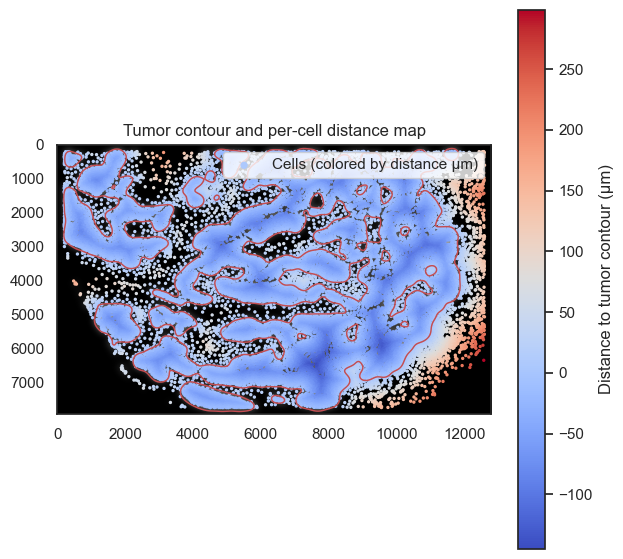

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



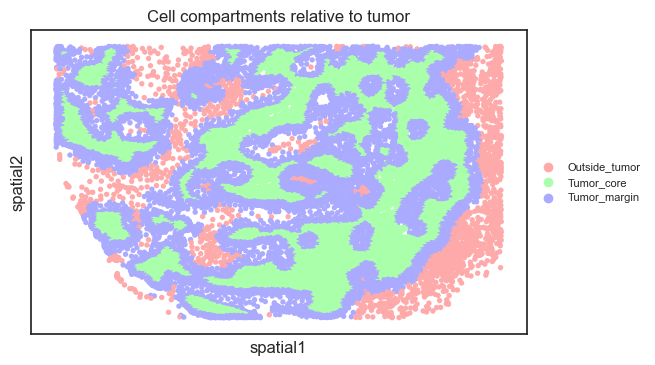

Processing NMC_15_ROI16...


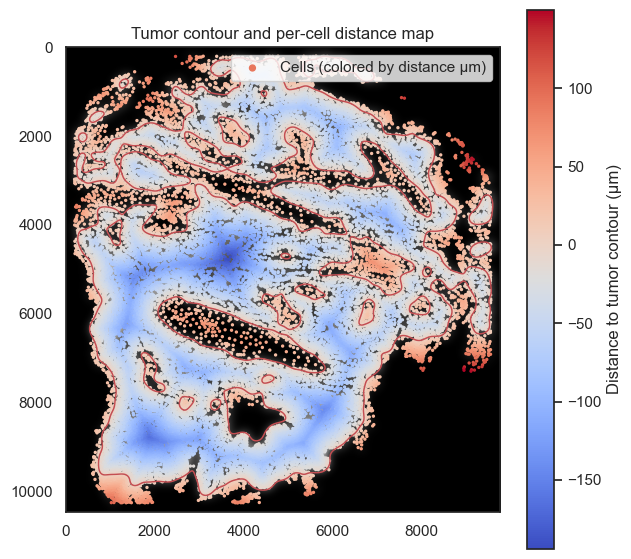

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



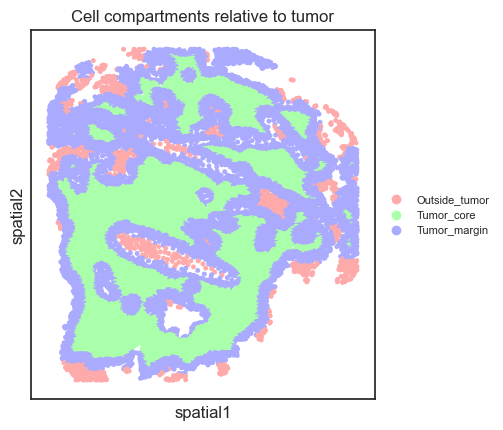

Processing NMC_15_ROI7...


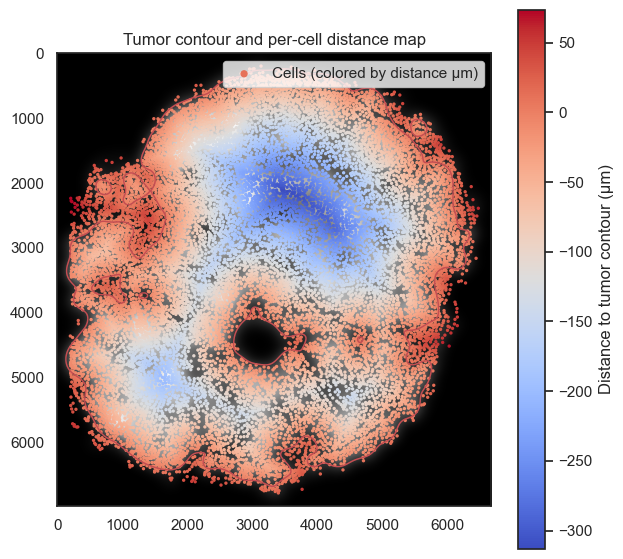

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



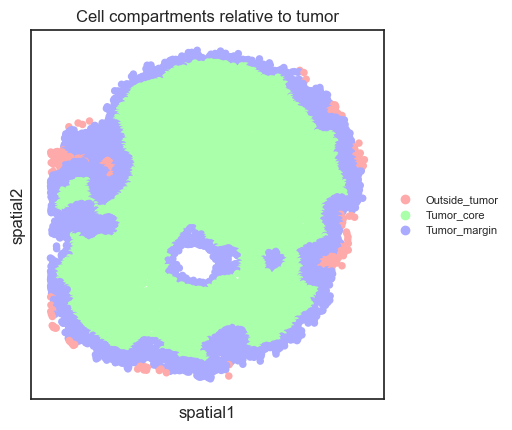

Processing NMC_1_ROI3...


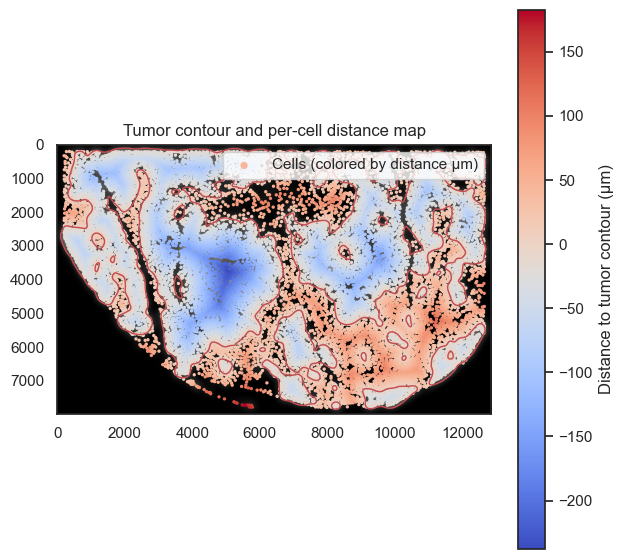

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



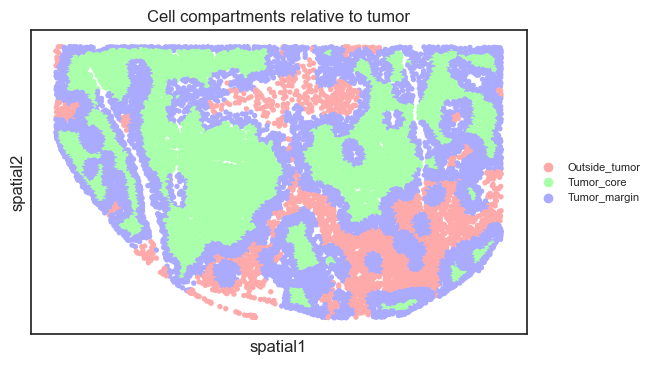

Processing NMC_16_ROI19...


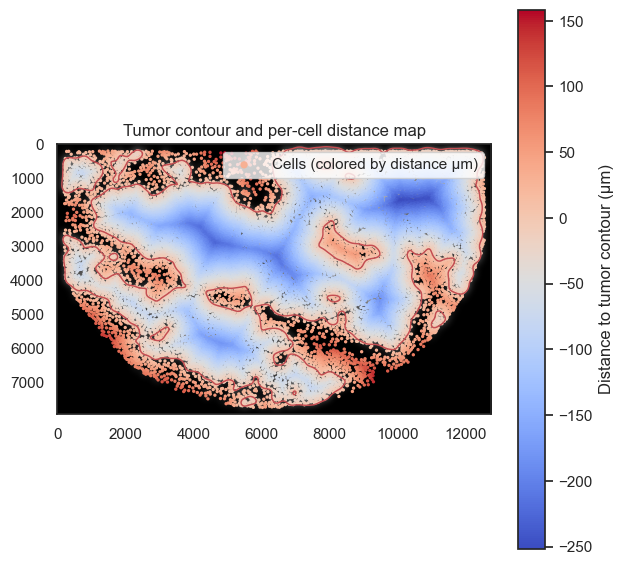

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



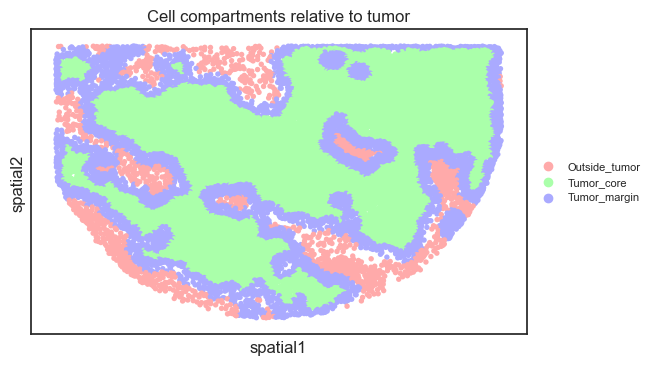

Processing NMC_2_ROI1...


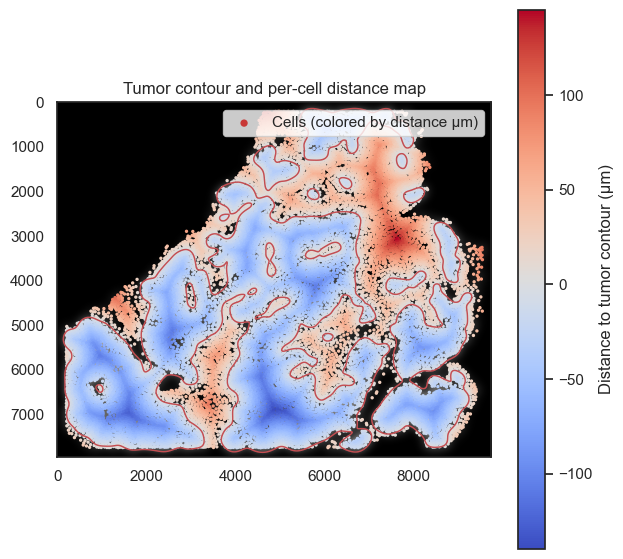

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



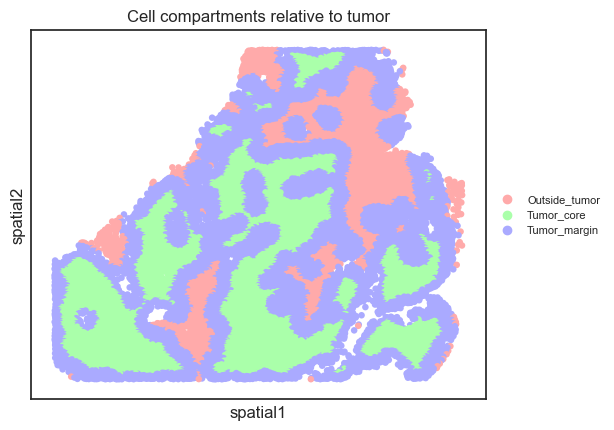

Processing NMC_14_ROI8...


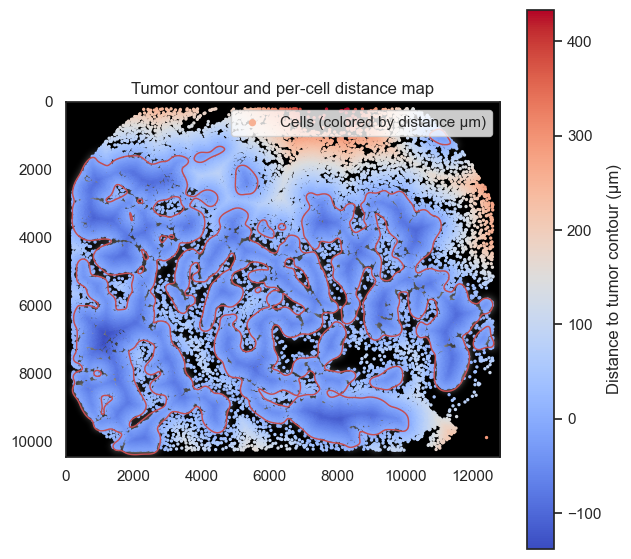

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



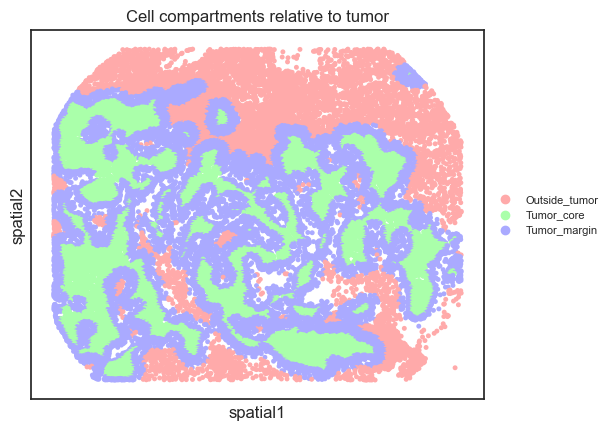

Processing NMC_16_ROI17...


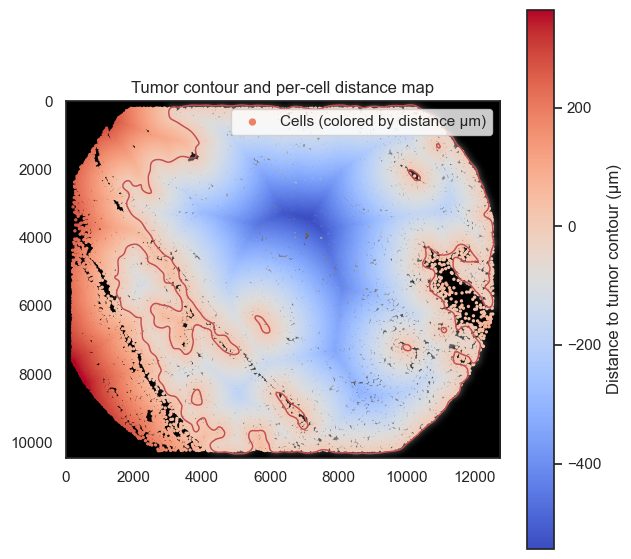

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



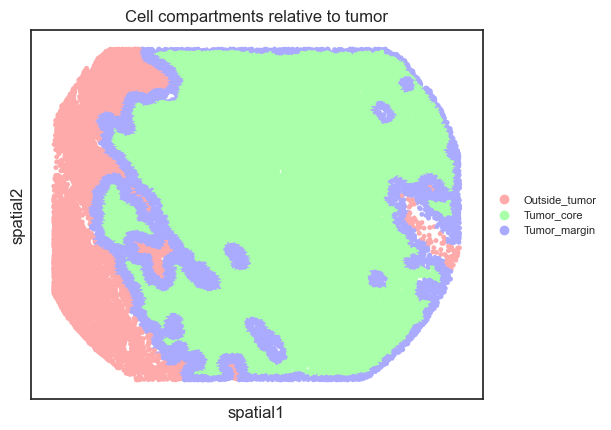

Processing NMC_5_ROI10...


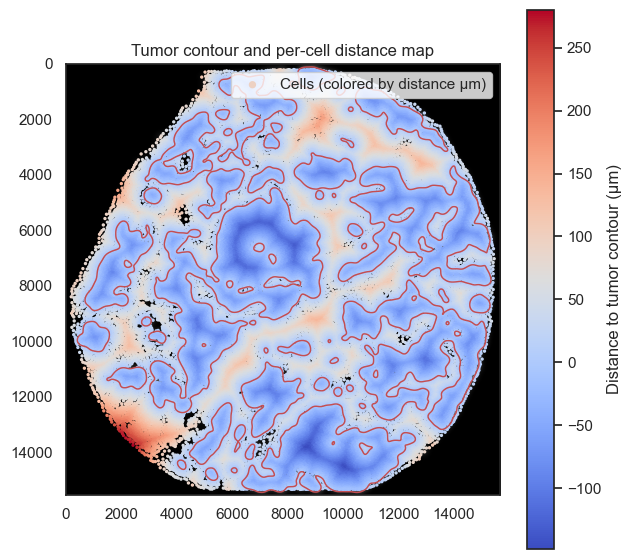

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



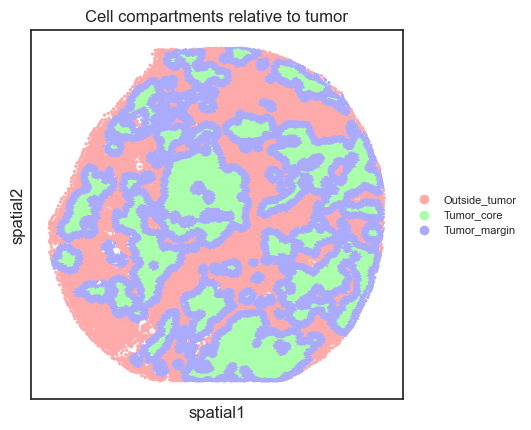

Processing NMC_8_ROI17...


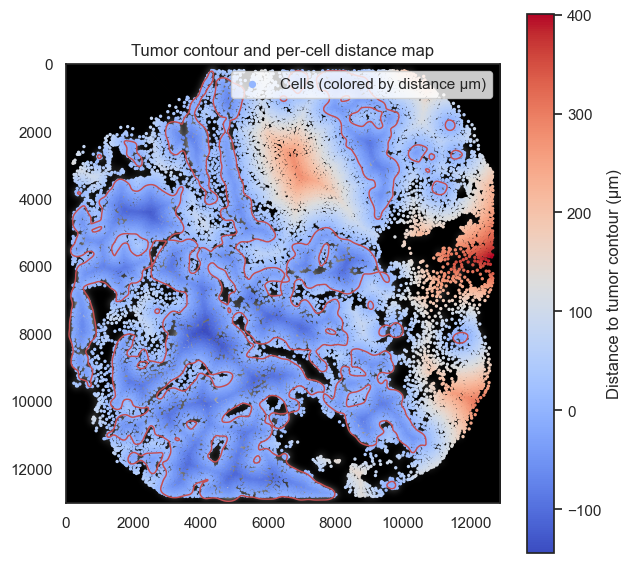

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



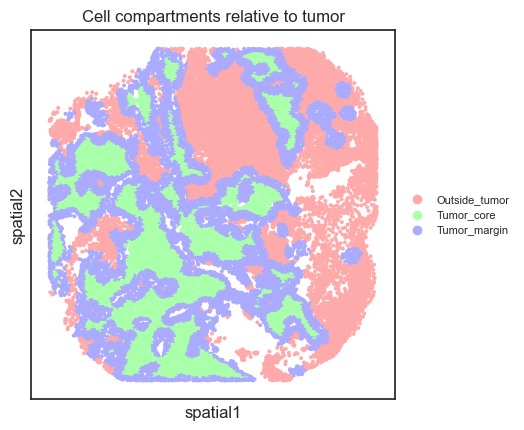

Processing NMC_5_ROI11...


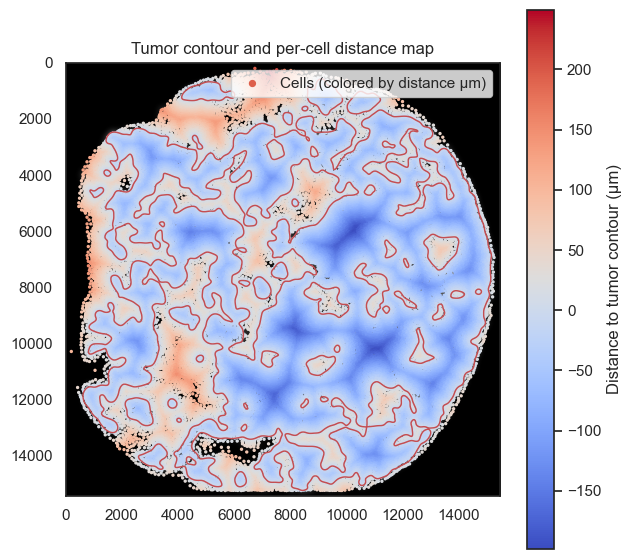

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



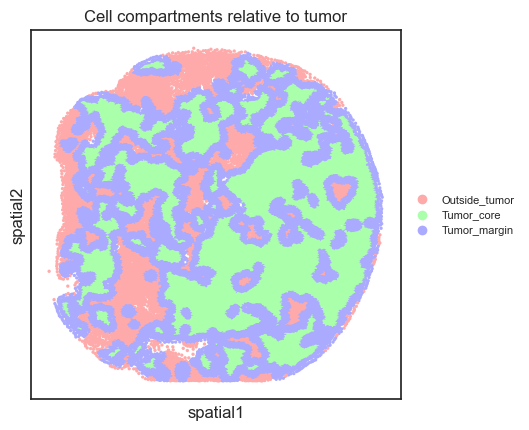

Processing NMC_13_ROI15...


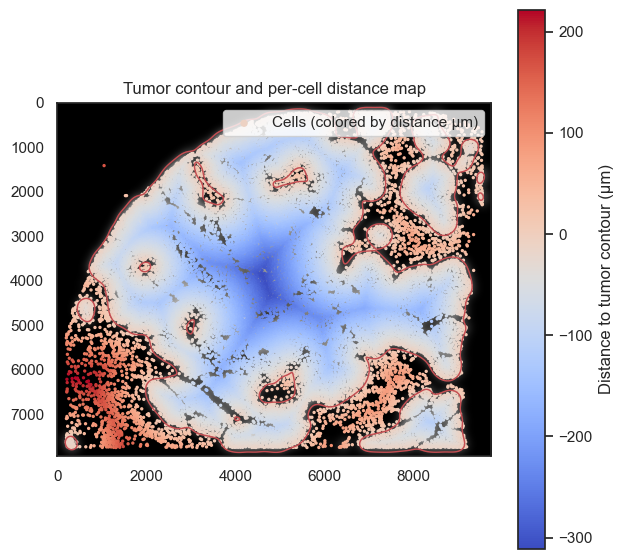

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



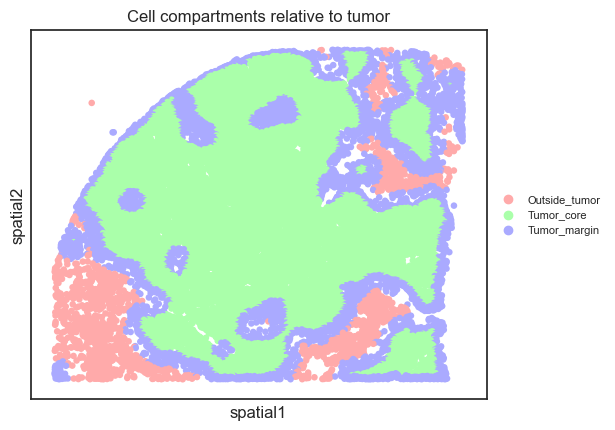

Processing NMC_1_ROI1...


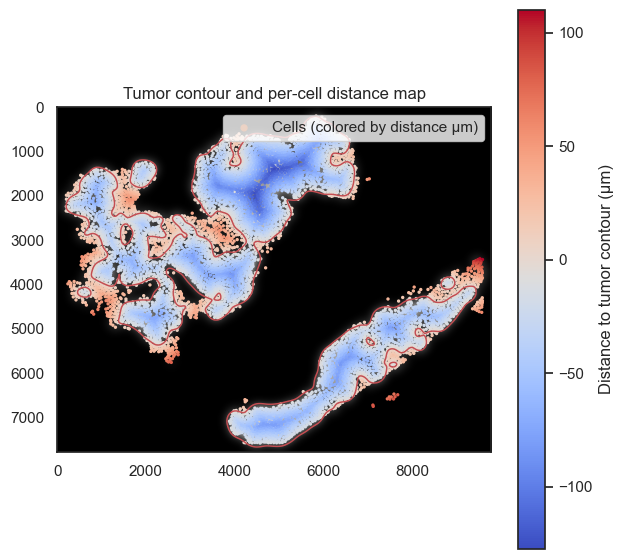

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



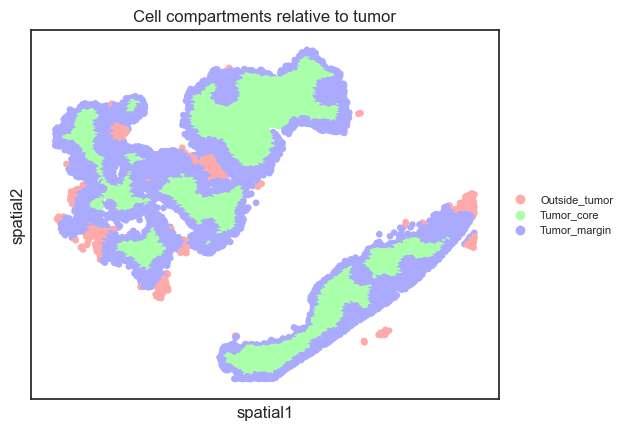

Processing NMC_9_ROI4...


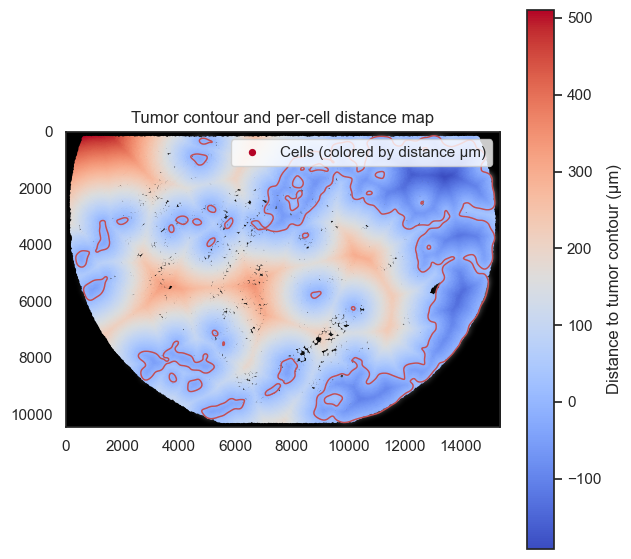

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



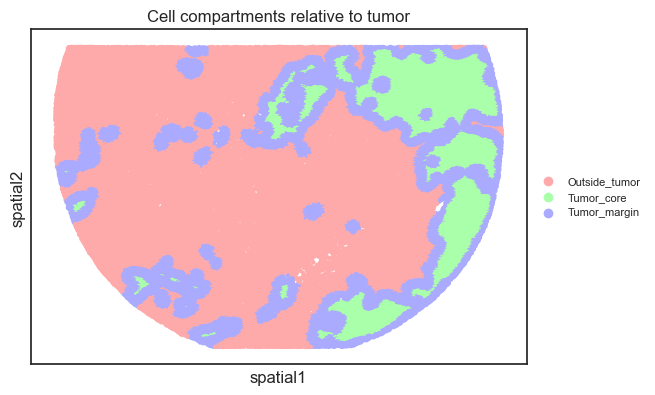

Processing NMC_21_ROI23...


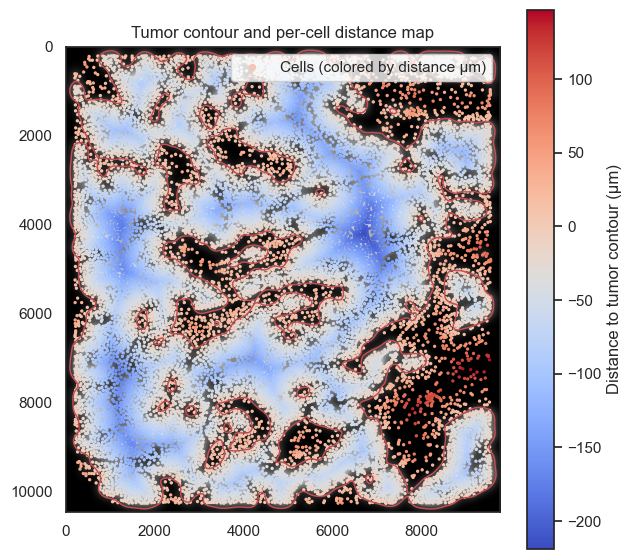

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



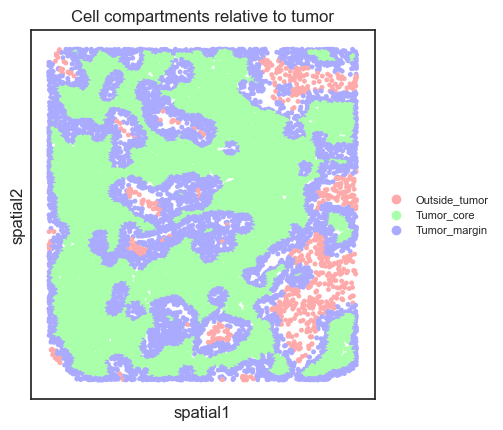

Processing NMC_9_ROI3...


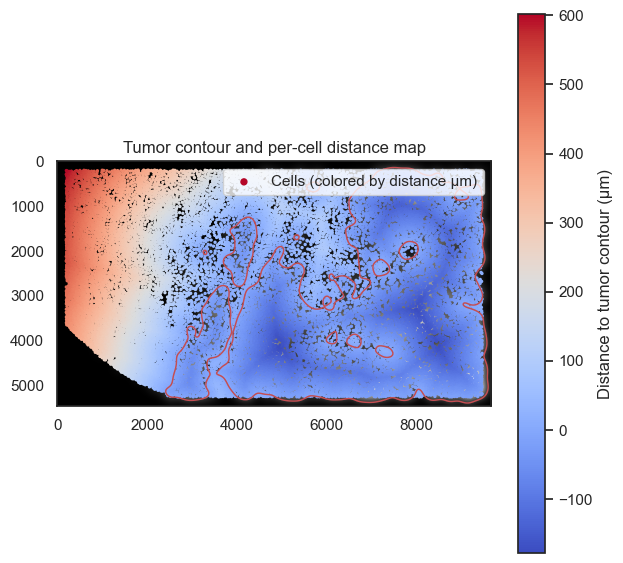

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



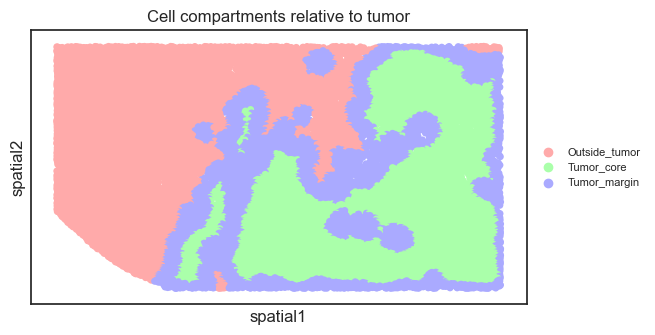

Processing NMC_4_ROI9...


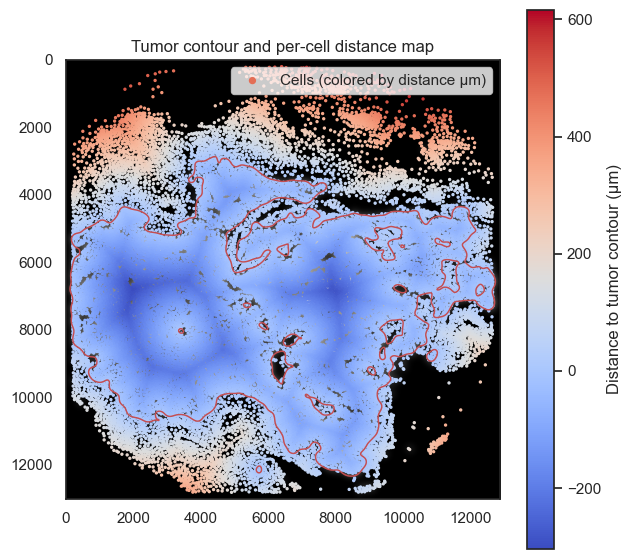

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



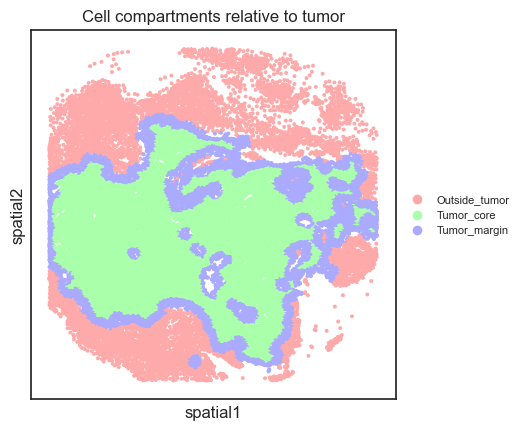

Processing NMC_13_ROI14...


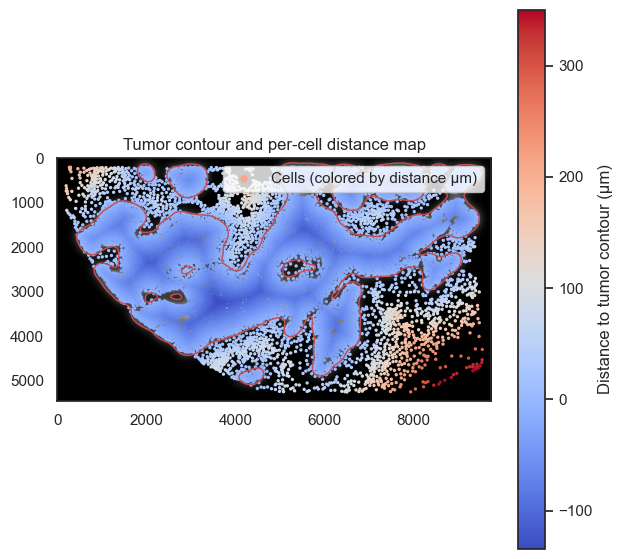

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



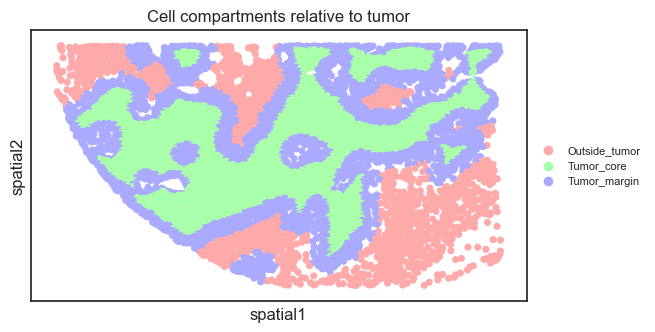

Processing NMC_7_ROI14...


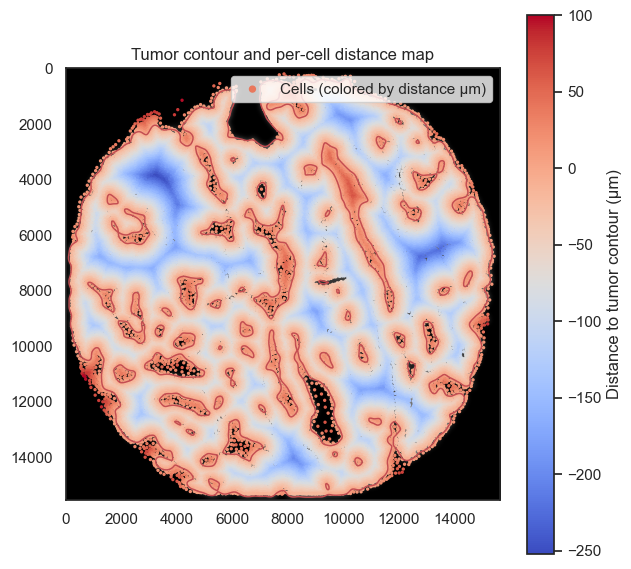

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



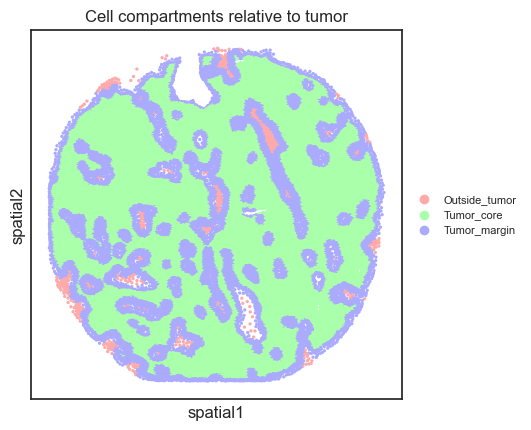

Processing NMC_7_ROI13...


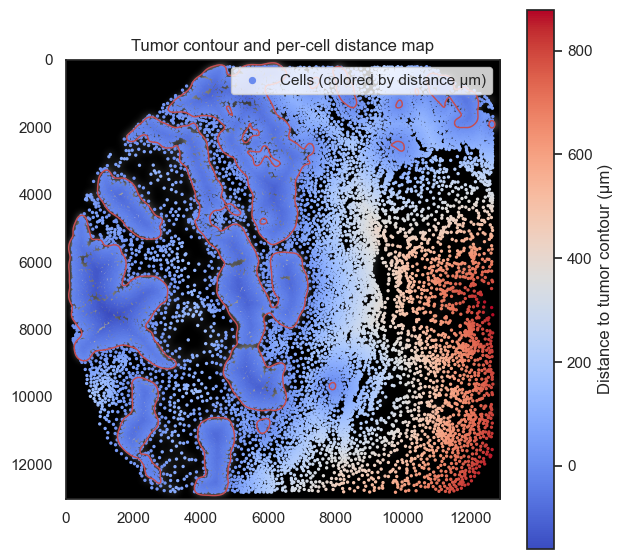

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/3297809340.py:97: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



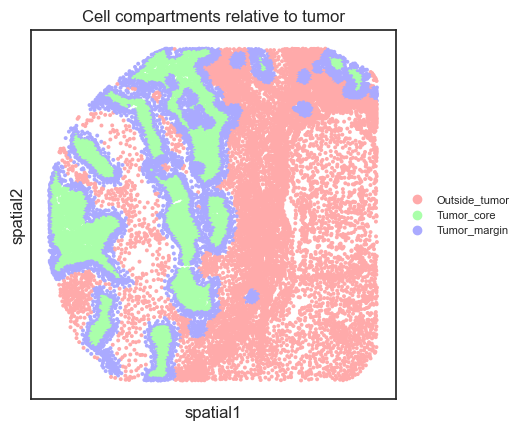

In [37]:
# --- Parameters ---
PIXEL_SIZE_UM = 0.17     # MACSIMA resolution
SMOOTH_SIGMA_PX = 120     # Gaussian smoothing for contour (≈ 8.5 µm)
THRESHOLD_REL = 0.2      # Relative threshold for density map (20% of max)
MIN_OBJECT_SIZE = 5000   # min area to keep (in pixels)
CLOSE_RADIUS = 5         # morphological closing radius (in pixels)
adata_unified.obs['dist_to_tumor_um'] = np.nan
adata_unified.obs['compartment'] = 'NA'

for patient_exp in adata_unified.obs['patient_exp'].unique():
    print(f"Processing {patient_exp}...")
    adata_select = adata_unified[adata_unified.obs['patient_exp'] == patient_exp].copy()
    # --- 1. Extract tumor coordinates ---
    tumor_cells = adata_select.obs[adata_select.obs['cell_type'] == 'Tumor_cells']
    x_tumor = tumor_cells['Cell Center X'].values
    y_tumor = tumor_cells['Cell Center Y'].values
    
    # --- 2. Define image canvas based on *all cells in ROI* ---
    x_all = adata_select.obs['Cell Center X'].values
    y_all = adata_select.obs['Cell Center Y'].values
    
    pad = 200  # pixels of padding
    x_min, x_max = x_all.min() - pad, x_all.max() + pad
    y_min, y_max = y_all.min() - pad, y_all.max() + pad
    W = int(np.ceil(x_max - x_min))
    H = int(np.ceil(y_max - y_min))
    
    # --- 3. Create tumor-cell density map ---
    density = np.zeros((H, W), dtype=np.float32)
    x_int = np.round(x_tumor - x_min).astype(int)
    y_int = np.round(y_tumor - y_min).astype(int)
    valid = (x_int >= 0) & (x_int < W) & (y_int >= 0) & (y_int < H)
    density[y_int[valid], x_int[valid]] += 1
    
    # Smooth to create continuous density
    density_smooth = gaussian_filter(density, sigma=SMOOTH_SIGMA_PX)
    
    # --- 4. Threshold to make tumor mask ---
    thr = THRESHOLD_REL * density_smooth.max()
    tumor_mask = density_smooth > thr
    
    # --- 5. Clean mask ---
    tumor_mask = morphology.remove_small_objects(tumor_mask, MIN_OBJECT_SIZE)
    tumor_mask = morphology.remove_small_holes(tumor_mask, area_threshold=MIN_OBJECT_SIZE)
    tumor_mask = morphology.binary_closing(tumor_mask, morphology.disk(CLOSE_RADIUS))
    
    # --- 6. Extract contour coordinates ---
    contours = measure.find_contours(tumor_mask, 0.5)
    contours = [c for c in contours if len(c) > 100]
    if len(contours) > 1:
        largest = max(contours, key=lambda c: len(c))
    else:
        largest = contours[0]
    contour_coords = np.fliplr(largest)  # to (x,y)
    
    # --- 7. Compute signed distance map (µm) ---
    dist_out_px = distance_transform_edt(~tumor_mask)
    dist_in_px  = distance_transform_edt(tumor_mask)
    signed_dist_um = dist_out_px.astype(float)
    signed_dist_um[tumor_mask] = -dist_in_px[tumor_mask]
    signed_dist_um *= PIXEL_SIZE_UM  # convert to µm
    
    # --- 8. Quantify distance for each cell (all cell types in ROI) ---
    x_idx = np.clip(np.round(x_all - x_min).astype(int), 0, W-1)
    y_idx = np.clip(np.round(y_all - y_min).astype(int), 0, H-1)
    cell_dist_um = signed_dist_um[y_idx, x_idx]
    
    adata_select.obs['dist_to_tumor_um'] = cell_dist_um
    
    # --- 9. Define compartments based on distance ---
    adata_select.obs['compartment'] = np.select(
        [
            adata_select.obs['dist_to_tumor_um'] < -30,                           # inside deep (core)
            (adata_select.obs['dist_to_tumor_um'] > -30) & (adata_select.obs['dist_to_tumor_um'] < 30),  # near edge
            adata_select.obs['dist_to_tumor_um'] >= 30                               # outside
        ],
        ['Tumor_core', 'Tumor_margin', 'Outside_tumor']
    )
    
    # --- 10. Visualization ---
    plt.figure(figsize=(7,7))
    plt.imshow(density_smooth, cmap='gray')
    plt.contour(tumor_mask, colors='r', linewidths=1)
    plt.scatter(
        adata_select.obs['Cell Center X'] - x_min,
        adata_select.obs['Cell Center Y'] - y_min,
        s=2,
        c=adata_select.obs['dist_to_tumor_um'],
        cmap='coolwarm',
        label='Cells (colored by distance µm)'
    )
    plt.title('Tumor contour and per-cell distance map')
    plt.colorbar(label='Distance to tumor contour (µm)')
    plt.legend(loc='upper right', markerscale=3)
    plt.show()
    
    sc.pl.spatial(
        adata_select,
        color='compartment',
        size=1.5,
        spot_size=100,
        palette=['#FFAAAA', '#AAFFAA', '#AAAAFF'],
        title='Cell compartments relative to tumor',
        legend_fontsize=8
    )

    # --- 11. Save back to adata_unified ---
    adata_unified.obs.loc[adata_select.obs_names, 'dist_to_tumor_um'] = adata_select.obs['dist_to_tumor_um']
    

In [ ]:
#bin the cell types by compartment

,cell_id,cell_type,level,parent_cell,type_no,Cell 3D Volume,Cell Bbox Bottom,Cell Bbox Left,Cell Bbox Right,Cell Bbox Top,...,Therapy (systemic),Survival after diagnosis of malignacy,Survival after NMC diagnosis,"treatment before MACSima sample withdrawal? If yes, which treatment?",site of biopsy/resection for MACSima sample,MACSima sample type,survival_time_months,cell_category,dist_to_tumor_um,compartment
0,1,NFC,1,0,21,1224,33,18,0,68,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,NFC,7.212489,NA
1,2,Tumor_cells,1,0,14,830,31,111,0,144,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-0.480833,NA
2,3,Tumor_cells,1,0,14,894,38,141,0,172,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-2.150349,NA
3,4,Tumor_cells,1,0,14,386,23,1469,0,1487,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-10.269182,NA
4,5,Tumor_cells,1,0,14,2331,39,1485,0,1567,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-13.031362,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571043,17816,Endothelial_cells,1,0,15,1622,12657,9559,12626,9628,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Endothelial cells,605.021187,NA
571044,17817,Endothelial_cells,1,0,15,9293,12657,10139,12528,10287,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Endothelial cells,658.084251,NA
571045,17818,Tumor_cells,1,0,14,1201,12657,4209,12629,4283,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Tumor cells,-15.458787,NA
571046,17819,NFC,1,0,21,5569,12657,3572,12574,3680,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,NFC,3.728391,NA


In [40]:
adata_unified.obs['compartment'] = np.select(
[
adata_unified.obs['dist_to_tumor_um'] < -30,                           # inside deep (core)
(adata_unified.obs['dist_to_tumor_um'] > -30) & (adata_unified.obs['dist_to_tumor_um'] < 30),  # near edge
adata_unified.obs['dist_to_tumor_um'] >= 30                               # outside
],
['Tumor_core', 'Tumor_margin', 'Outside_tumor']
)

In [41]:
adata_unified.obs

,cell_id,cell_type,level,parent_cell,type_no,Cell 3D Volume,Cell Bbox Bottom,Cell Bbox Left,Cell Bbox Right,Cell Bbox Top,...,Therapy (systemic),Survival after diagnosis of malignacy,Survival after NMC diagnosis,"treatment before MACSima sample withdrawal? If yes, which treatment?",site of biopsy/resection for MACSima sample,MACSima sample type,survival_time_months,cell_category,dist_to_tumor_um,compartment
0,1,NFC,1,0,21,1224,33,18,0,68,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,NFC,7.212489,Tumor_margin
1,2,Tumor_cells,1,0,14,830,31,111,0,144,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-0.480833,Tumor_margin
2,3,Tumor_cells,1,0,14,894,38,141,0,172,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-2.150349,Tumor_margin
3,4,Tumor_cells,1,0,14,386,23,1469,0,1487,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-10.269182,Tumor_margin
4,5,Tumor_cells,1,0,14,2331,39,1485,0,1567,...,"01.08.2018: Paclitaxel, 5-FU",19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-13.031362,Tumor_margin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571043,17816,Endothelial_cells,1,0,15,1622,12657,9559,12626,9628,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Endothelial cells,605.021187,Outside_tumor
571044,17817,Endothelial_cells,1,0,15,9293,12657,10139,12528,10287,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Endothelial cells,658.084251,Outside_tumor
571045,17818,Tumor_cells,1,0,14,1201,12657,4209,12629,4283,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Tumor cells,-15.458787,Tumor_margin
571046,17819,NFC,1,0,21,5569,12657,3572,12574,3680,...,VAI/PAI\nCarboplatin/ Etoposid/ Paclitaxel \nB...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,NFC,3.728391,Tumor_margin


In [45]:
# Extract the distance values
max_dist = np.ceil(np.abs(distances).max() / 10) * 10  # round up to nearest 10
bin_edges = np.arange(-max_dist, max_dist + 10, 10)

# Assign each cell to a distance bin
adata_unified.obs["distance_bin"] = pd.cut(distances, bins=bin_edges)

adata_unified.obs

,cell_id,cell_type,level,parent_cell,type_no,Cell 3D Volume,Cell Bbox Bottom,Cell Bbox Left,Cell Bbox Right,Cell Bbox Top,...,Survival after diagnosis of malignacy,Survival after NMC diagnosis,"treatment before MACSima sample withdrawal? If yes, which treatment?",site of biopsy/resection for MACSima sample,MACSima sample type,survival_time_months,cell_category,dist_to_tumor_um,compartment,distance_bin
0,1,NFC,1,0,21,1224,33,18,0,68,...,19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,NFC,7.212489,Tumor_margin,"(0.0, 10.0]"
1,2,Tumor_cells,1,0,14,830,31,111,0,144,...,19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-0.480833,Tumor_margin,"(-10.0, 0.0]"
2,3,Tumor_cells,1,0,14,894,38,141,0,172,...,19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-2.150349,Tumor_margin,"(-10.0, 0.0]"
3,4,Tumor_cells,1,0,14,386,23,1469,0,1487,...,19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-10.269182,Tumor_margin,"(-20.0, -10.0]"
4,5,Tumor_cells,1,0,14,2331,39,1485,0,1567,...,19 months (80 weeks),2 months (10 weeks),-,retroportal lymph node,r0,2.0,Tumor cells,-13.031362,Tumor_margin,"(-20.0, -10.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571043,17816,Endothelial_cells,1,0,15,1622,12657,9559,12626,9628,...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Endothelial cells,605.021187,Outside_tumor,"(600.0, 610.0]"
571044,17817,Endothelial_cells,1,0,15,9293,12657,10139,12528,10287,...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Endothelial cells,658.084251,Outside_tumor,"(650.0, 660.0]"
571045,17818,Tumor_cells,1,0,14,1201,12657,4209,12629,4283,...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,Tumor cells,-15.458787,Tumor_margin,"(-20.0, -10.0]"
571046,17819,NFC,1,0,21,5569,12657,3572,12574,3680,...,10 months (43 weeks),9 months (40 weeks),-,"cervical ymph node (mainly tumor, only border ...",b1,9.0,NFC,3.728391,Tumor_margin,"(0.0, 10.0]"


/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/559669203.py:52: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/559669203.py:59: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/559669203.py:64: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



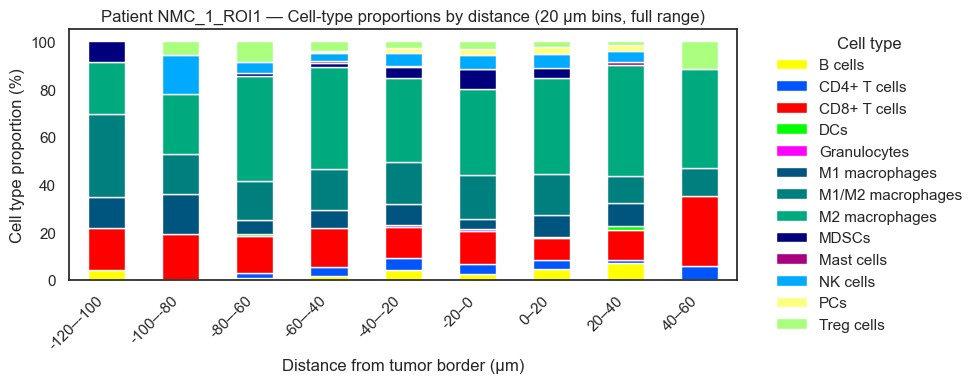

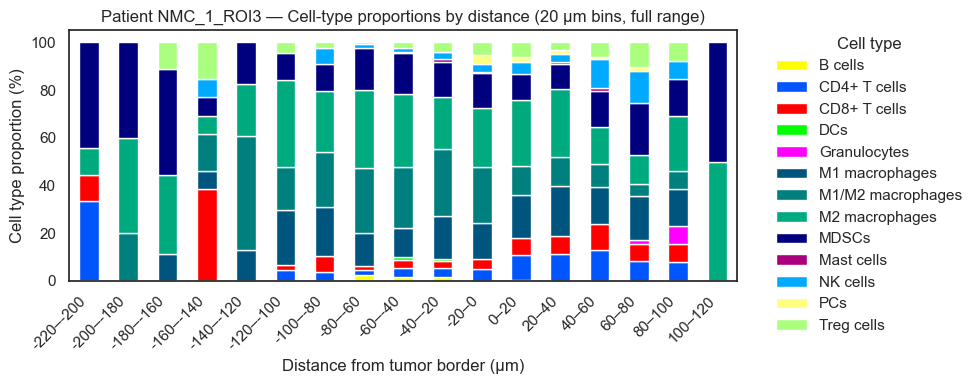

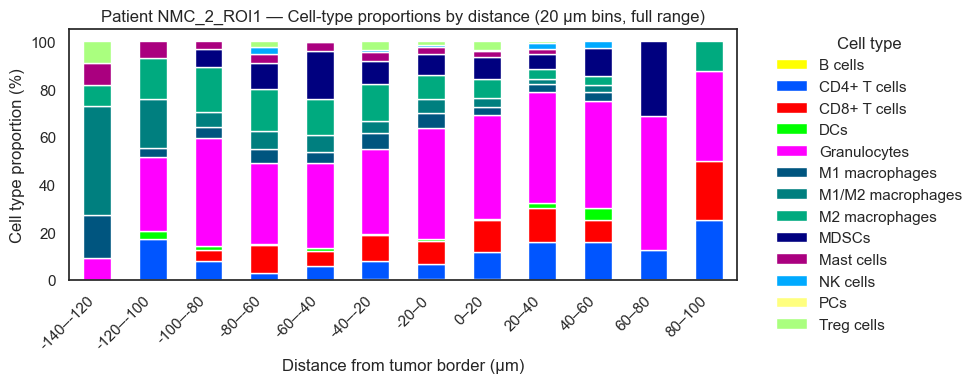

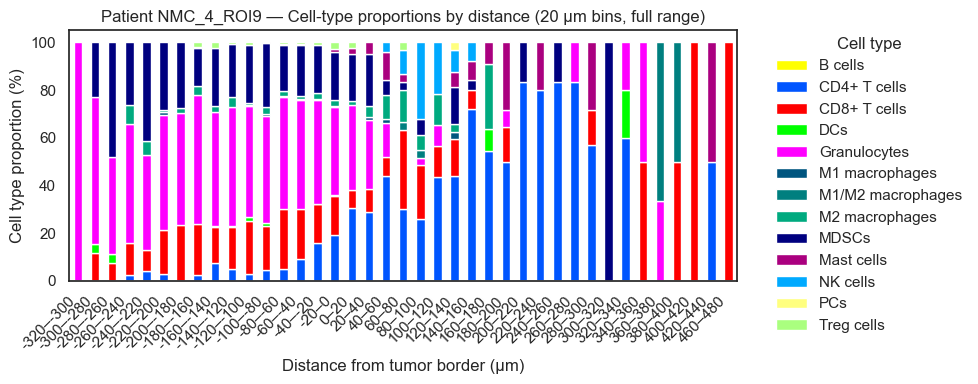

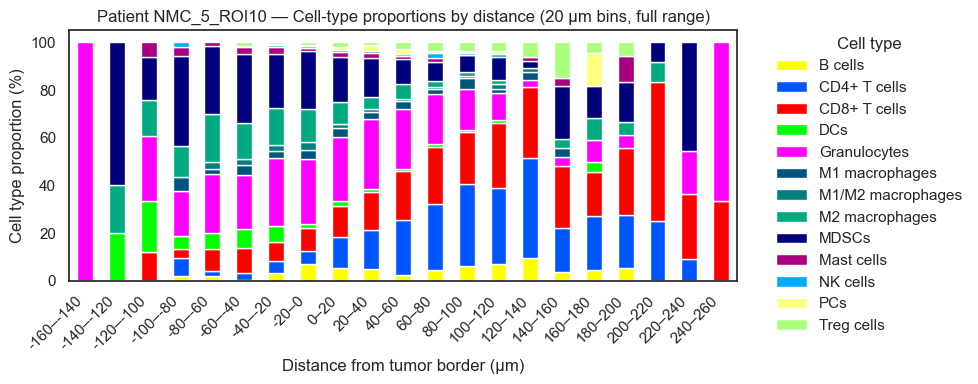

...

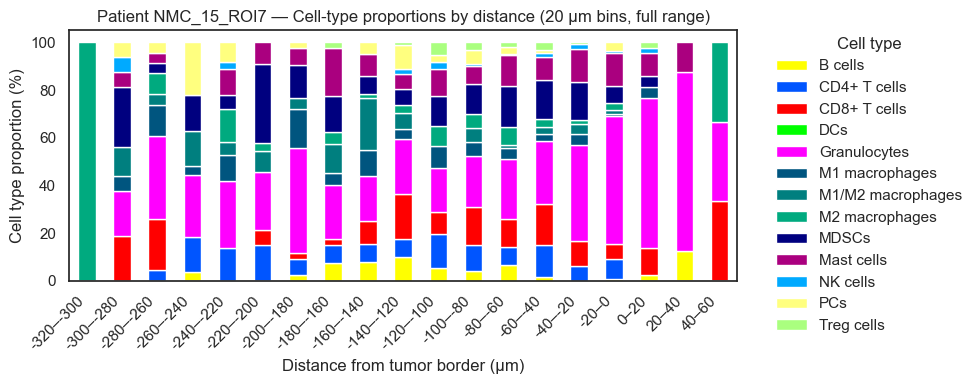

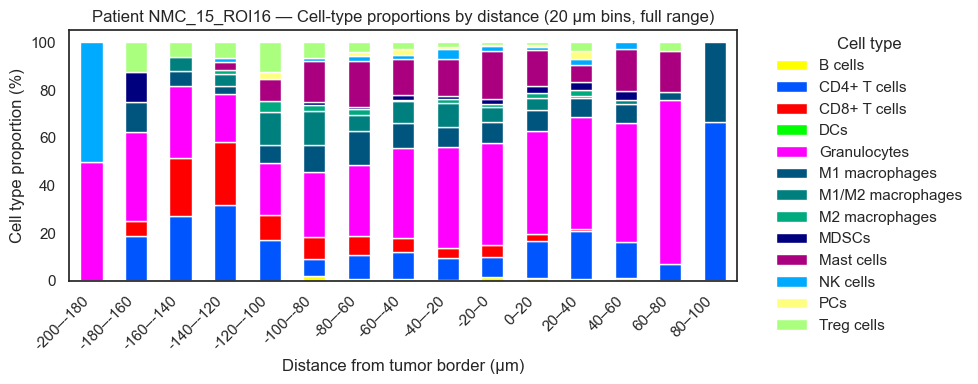

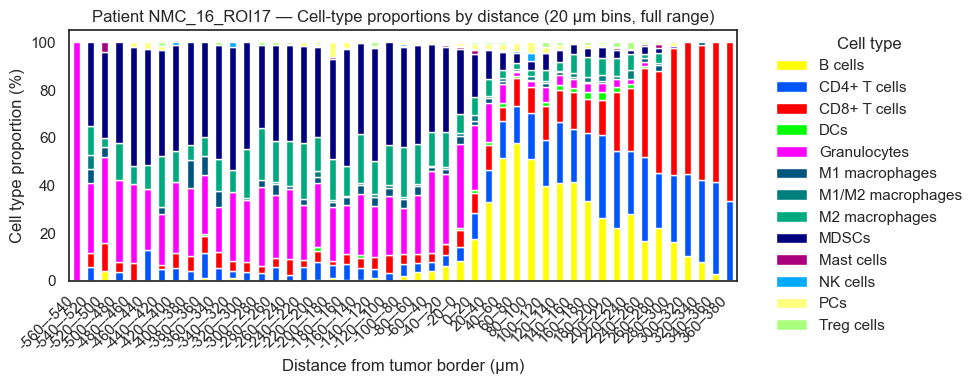

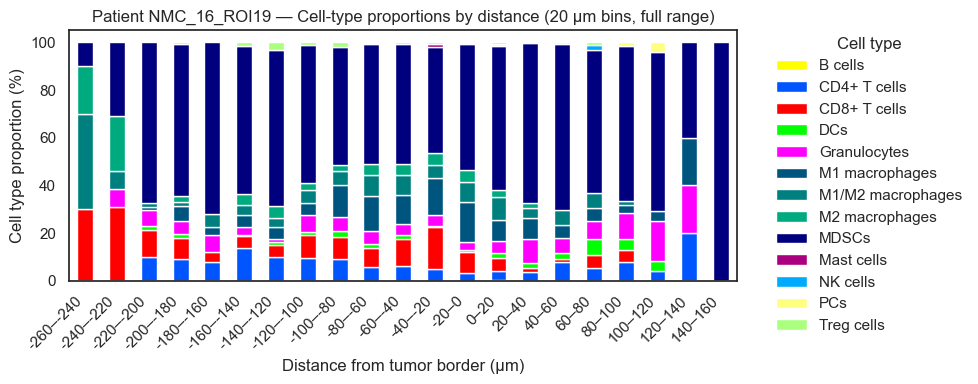

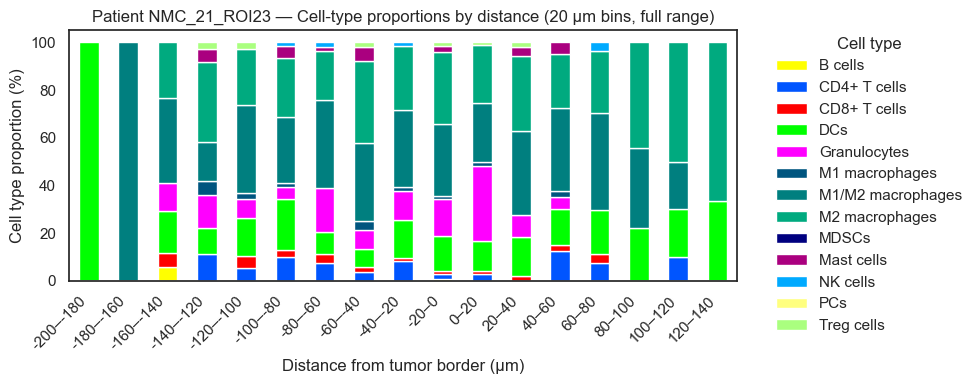

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1. Define your cell colors ---
cell_category_color = {
    "Actin+ cells": "#AAAAFF",
    "B cells": "#FFFF00",
    "DCs": "#00FF00",
    "Endothelial cells": "#55FFFF",
    "Granulocytes": "#FF00FF",
    "Lymphatic endothelial cells": "#0055FF",
    "Mast cells": "#AA007F",
    "MDSCs": "#00007F",
    "NFC": "#A9A9A9",
    "NK cells": "#00AAFF",
    "PCs": "#FFFF7F",
    "CD4+ T cells": "#0055FF",
    "CD8+ T cells": "#FF0000",
    "Treg cells": "#AAFF7F",
    "Tumor cells": "#555555",
    "Epithelial cells": "#FFCC99",
    "M1 macrophages": "#00557F",
    "M2 macrophages": "#00AA7F",
    "M1/M2 macrophages": "#007F7F",
}

# --- Step 2. Define excluded cell types ---
exclude_types = [
    "Tumor_cells", "Tumor cells",
    "NFC",
    "Actin+ cells",
    "Epithelial cells",
    "Endothelial cells",
    "Lymphatic endothelial cells",
]

# --- Step 3. Prepare distances and bins (full range, 20 µm steps) ---
dist = adata_unified.obs["dist_to_tumor_um"]
min_edge = np.floor(dist.min() / 20) * 20
max_edge = np.ceil(dist.max() / 20) * 20
edges = np.arange(min_edge, max_edge + 20, 20)
adata_unified.obs["distance_bin_20um"] = pd.cut(dist, bins=edges, include_lowest=True)

# --- Step 4. Filter unwanted cell types ---
obs_filtered = adata_unified.obs[
    ~adata_unified.obs["cell_category"].str.strip().isin(exclude_types)
].copy()

# --- Step 5. Group counts by patient × distance × cell type ---
counts = (
    obs_filtered.groupby(["patient_exp", "distance_bin_20um", "cell_category"])
    .size()
    .reset_index(name="count")
)

# --- Step 6. Convert to % within each patient × distance bin ---
counts["pct"] = (
    counts.groupby(["patient_exp", "distance_bin_20um"])["count"]
    .transform(lambda x: 100 * x / x.sum())
)

# --- Step 7. Pivot for plotting ---
pivot = counts.pivot_table(
    index=["distance_bin_20um", "patient_exp"],
    columns="cell_category",
    values="pct",
    fill_value=0
).reset_index()

pivot["distance_left"] = pivot["distance_bin_20um"].apply(lambda iv: iv.left)
pivot = pivot.sort_values(["patient_exp", "distance_left"])

# --- Step 8. Prepare color mapping (only for remaining categories) ---
remaining_cells = sorted([c for c in counts["cell_category"].unique() if c in cell_category_color])
color_dict = {k: cell_category_color[k] for k in remaining_cells}

# --- Step 9. Plot each patient ---
patients = pivot["patient_exp"].unique()

for patient in patients:
    df_patient = pivot[pivot["patient_exp"] == patient].copy()
    df_patient = df_patient.set_index("distance_bin_20um")

    ax = df_patient.drop(columns=["patient_exp", "distance_left"]).plot(
        kind="bar",
        stacked=True,
        figsize=(10, 4),
        color=[color_dict[c] for c in df_patient.columns if c in color_dict],
        legend=False  # hide default legend for custom placement
    )

    ax.set_title(f"Patient {patient} — Cell-type proportions by distance (20 µm bins, full range)")
    ax.set_xlabel("Distance from tumor border (µm)")
    ax.set_ylabel("Cell type proportion (%)")
    ax.set_xticklabels(
        [f"{int(iv.left)}–{int(iv.right)}" for iv in df_patient.index],
        rotation=45,
        ha="right"
    )

    # --- Legend outside plot ---
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        handles,
        labels,
        title="Cell type",
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        borderaxespad=0.,
        frameon=False
    )

    plt.tight_layout()
    plt.show()


/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/258308499.py:52: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/258308499.py:59: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/258308499.py:64: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



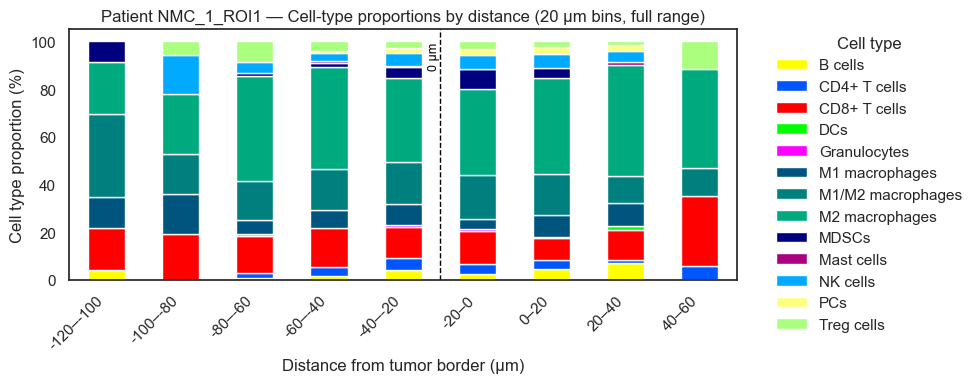

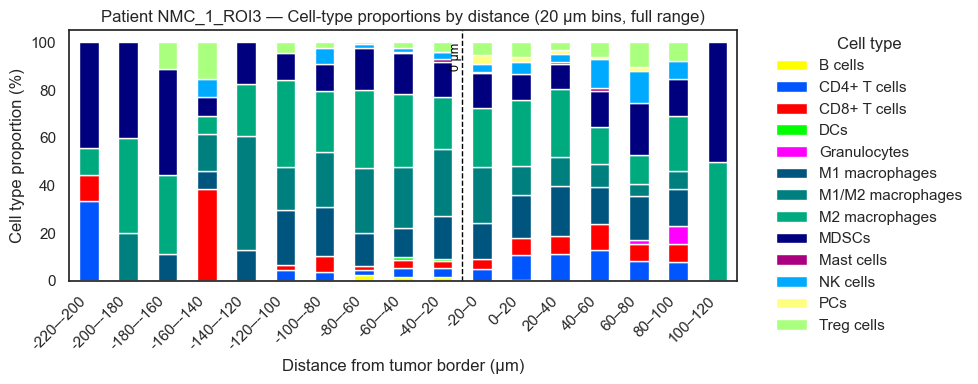

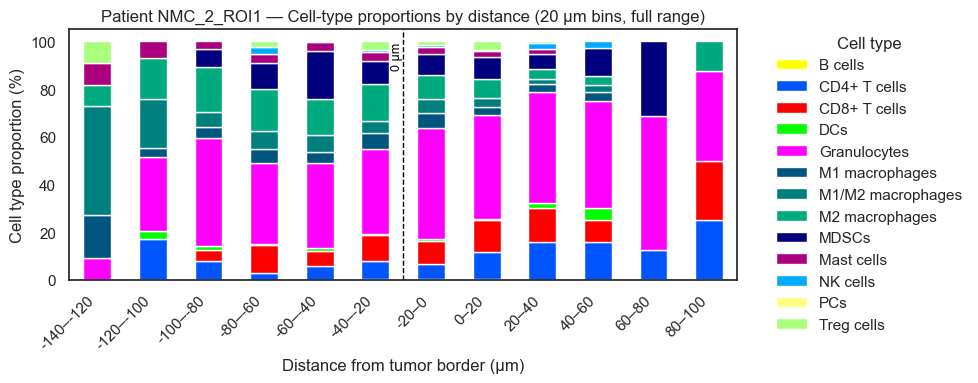

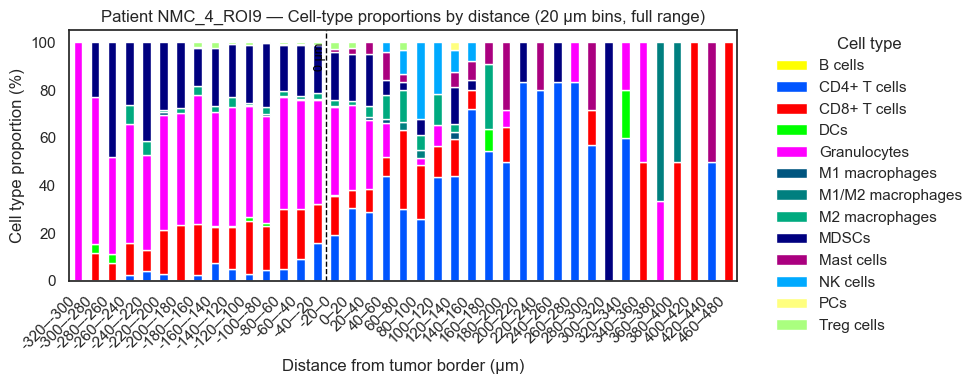

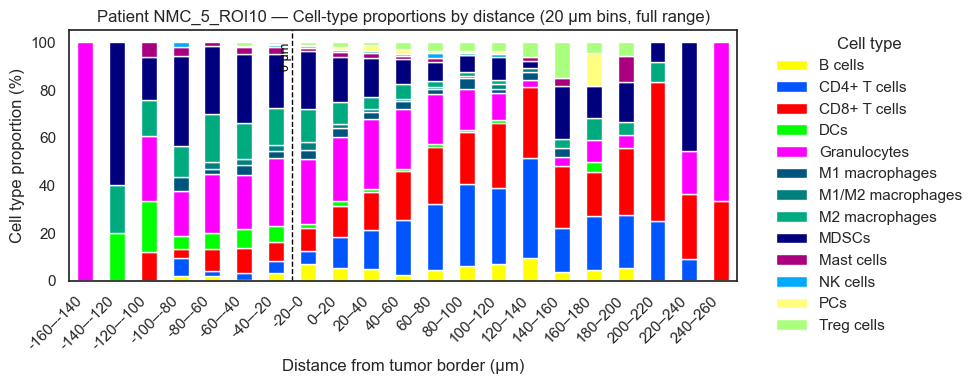

...

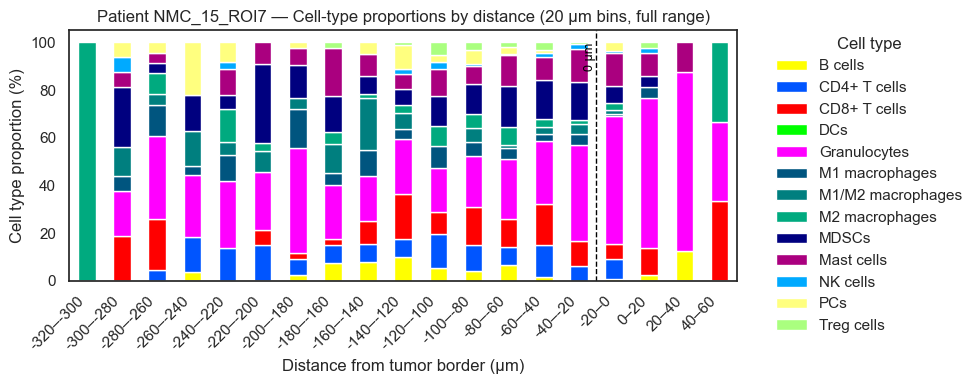

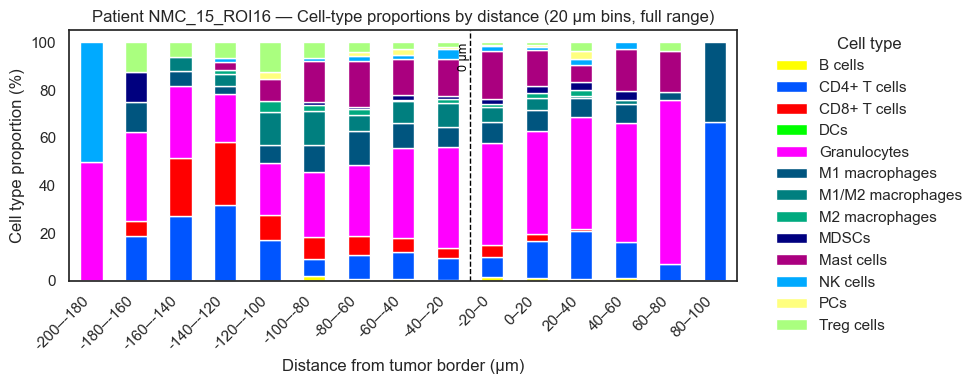

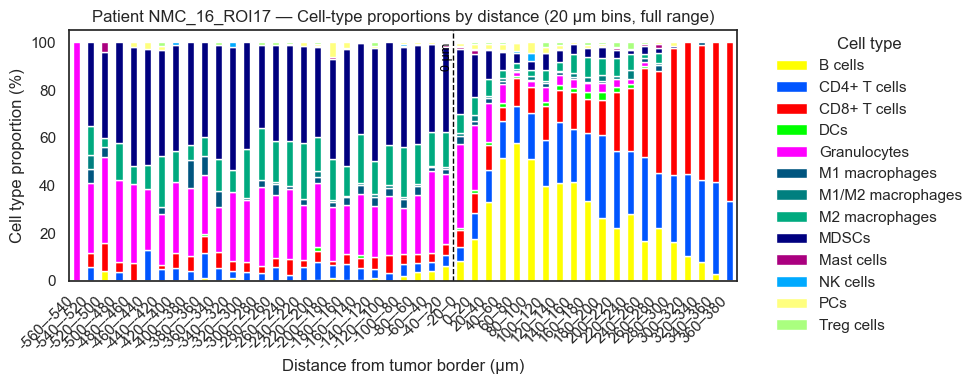

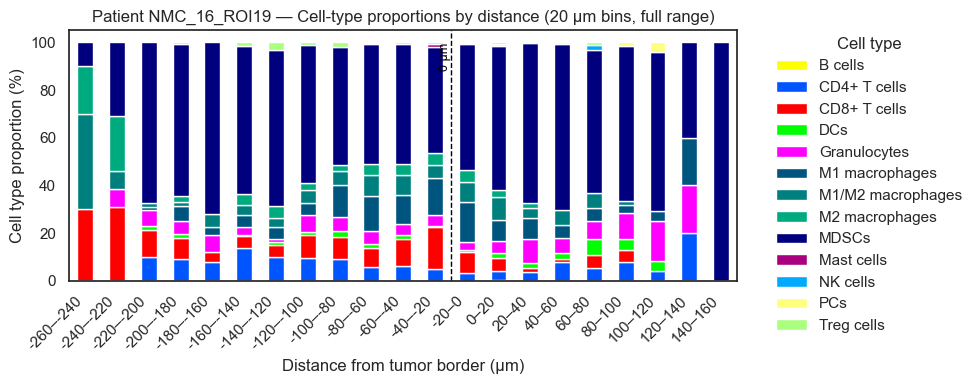

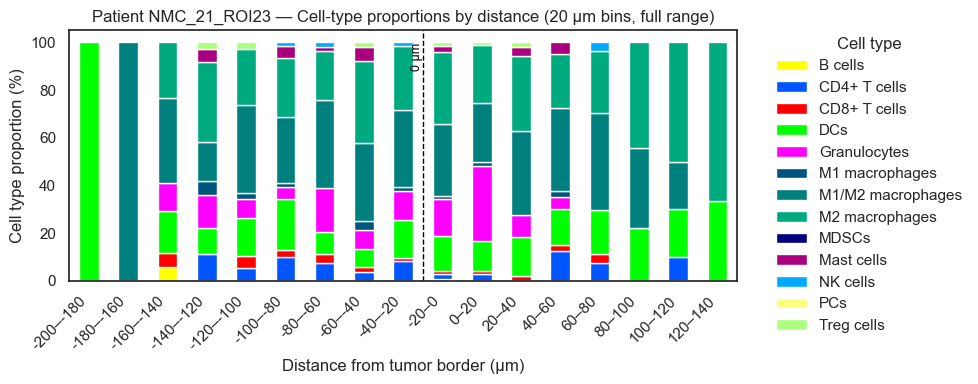

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1. Define your color mapping ---
cell_category_color = {
    "Actin+ cells": "#AAAAFF",
    "B cells": "#FFFF00",
    "DCs": "#00FF00",
    "Endothelial cells": "#55FFFF",
    "Granulocytes": "#FF00FF",
    "Lymphatic endothelial cells": "#0055FF",
    "Mast cells": "#AA007F",
    "MDSCs": "#00007F",
    "NFC": "#A9A9A9",
    "NK cells": "#00AAFF",
    "PCs": "#FFFF7F",
    "CD4+ T cells": "#0055FF",
    "CD8+ T cells": "#FF0000",
    "Treg cells": "#AAFF7F",
    "Tumor cells": "#555555",
    "Epithelial cells": "#FFCC99",
    "M1 macrophages": "#00557F",
    "M2 macrophages": "#00AA7F",
    "M1/M2 macrophages": "#007F7F",
}

# --- Step 2. Exclude unwanted cell types ---
exclude_types = [
    "Tumor_cells", "Tumor cells",
    "NFC",
    "Actin+ cells",
    "Epithelial cells",
    "Endothelial cells",
    "Lymphatic endothelial cells",
]

# --- Step 3. Prepare distances and create bins ---
dist = adata_unified.obs["dist_to_tumor_um"]
min_edge = np.floor(dist.min() / 20) * 20
max_edge = np.ceil(dist.max() / 20) * 20
edges = np.arange(min_edge, max_edge + 20, 20)
adata_unified.obs["distance_bin_20um"] = pd.cut(dist, bins=edges, include_lowest=True)

# --- Step 4. Filter unwanted cell types ---
obs_filtered = adata_unified.obs[
    ~adata_unified.obs["cell_category"].str.strip().isin(exclude_types)
].copy()

# --- Step 5. Group counts by patient × distance × cell type ---
counts = (
    obs_filtered.groupby(["patient_exp", "distance_bin_20um", "cell_category"])
    .size()
    .reset_index(name="count")
)

# --- Step 6. Convert to % within each patient × distance bin ---
counts["pct"] = (
    counts.groupby(["patient_exp", "distance_bin_20um"])["count"]
    .transform(lambda x: 100 * x / x.sum())
)

# --- Step 7. Pivot for plotting ---
pivot = counts.pivot_table(
    index=["distance_bin_20um", "patient_exp"],
    columns="cell_category",
    values="pct",
    fill_value=0
).reset_index()

pivot["distance_left"] = pivot["distance_bin_20um"].apply(lambda iv: iv.left)
pivot = pivot.sort_values(["patient_exp", "distance_left"])

# --- Step 8. Prepare color mapping for remaining categories ---
remaining_cells = sorted([c for c in counts["cell_category"].unique() if c in cell_category_color])
color_dict = {k: cell_category_color[k] for k in remaining_cells}

# --- Step 9. Plot each patient with vertical tumor border at 0 µm ---
patients = pivot["patient_exp"].unique()

for patient in patients:
    df_patient = pivot[pivot["patient_exp"] == patient].copy()
    df_patient = df_patient.set_index("distance_bin_20um")

    ax = df_patient.drop(columns=["patient_exp", "distance_left"]).plot(
        kind="bar",
        stacked=True,
        figsize=(10, 4),
        color=[color_dict[c] for c in df_patient.columns if c in color_dict],
        legend=False
    )

    # Labels and title
    ax.set_title(f"Patient {patient} — Cell-type proportions by distance (20 µm bins, full range)")
    ax.set_xlabel("Distance from tumor border (µm)")
    ax.set_ylabel("Cell type proportion (%)")
    xtick_labels = [f"{int(iv.left)}–{int(iv.right)}" for iv in df_patient.index]
    ax.set_xticklabels(xtick_labels, rotation=45, ha="right")

    # --- Add dashed vertical line at 0 µm (tumor border) ---
    # Find bin index where 0 would fall between left/right edges
    zero_bin_index = next(
        (i for i, iv in enumerate(df_patient.index) if iv.left <= 0 <= iv.right),
        None
    )
    if zero_bin_index is not None:
        ax.axvline(x=zero_bin_index - 0.5, color="black", linestyle="--", linewidth=1)
        ax.text(
            zero_bin_index - 0.5, ax.get_ylim()[1] * 0.95, "0 µm",
            rotation=90, va="top", ha="right", color="black", fontsize=9
        )

    # Legend outside
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        handles,
        labels,
        title="Cell type",
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        borderaxespad=0.,
        frameon=False
    )

    plt.tight_layout()
    plt.show()


/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/572034166.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/572034166.py:26: FutureWarning:

Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/572034166.py:63: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/572034166.py:64: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so resul

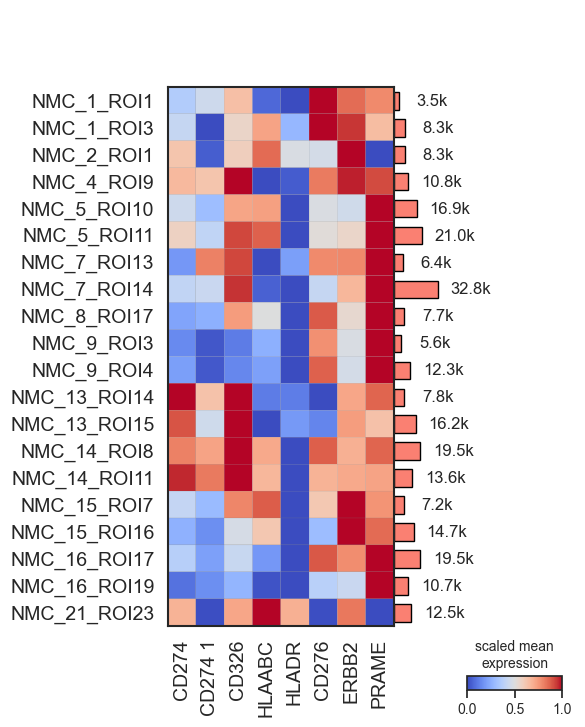

In [104]:
from scipy import sparse

adata_unified_test = adata_unified.copy()
adata_unified_test.X = np.arcsinh(adata_unified_test.X / 5)

# --- Step 2. Z-score each gene *within each patient* ---
adata_scaled_list = []

for patient, adata_p in adata_unified_test.obs.groupby("patient_exp"):
    # subset this patient’s data
    adata_patient = adata_unified_test[adata_unified_test.obs["patient_exp"] == patient].copy()

    X = adata_patient.X.A if sparse.issparse(adata_patient.X) else adata_patient.X

    # compute per-gene mean and std
    mean = X.mean(axis=0)
    std = X.std(axis=0)
    std[std == 0] = 1  # avoid division by zero

    X_scaled = (X - mean) / std
    adata_patient.X = X_scaled

    adata_scaled_list.append(adata_patient)

# Merge all scaled patients back into one AnnData
adata_scaled = adata_scaled_list[0].concatenate(
    *adata_scaled_list[1:], batch_key=None
)

# --- Step 3. Now subset only tumor cells ---
adata_scaled_tumor = adata_scaled[adata_scaled.obs["cell_type"] == "Tumor_cells"].copy()


fig = sc.pl.matrixplot(
adata_scaled_tumor, 
var_names=tumor_markers, 
groupby='patient_exp', 
cmap="coolwarm",
standard_scale="group",
use_raw=False,
show=False,
return_fig=True,
)


adata_select 

fig.add_totals()
axes = fig.get_axes()
ax = axes['mainplot_ax']
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)  # Full rotation control
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)  # Font size
group_ax = axes['group_extra_ax']
for text in group_ax.texts:
    text.set_fontsize(12)
    current_pos = text.get_position()
    text.set_position((current_pos[0] + 14, current_pos[1] +1.5 ))
cax = axes['color_legend_ax']
cax.set_title('scaled mean\nexpression', fontsize=10)
cax_current_pos = cax.get_position()
cax.set_position((cax_current_pos.x0 - 0.025, cax_current_pos.y0 - 0.08, cax_current_pos.width, cax_current_pos.height))
fig = axes['mainplot_ax'].figure
fig.tight_layout()
plt.tight_layout()


In [74]:
tumor_markers = ["CD274", "CD274 1", "CD326", "HLAABC", "HLADR", "CD276", "ERBB2", "PRAME"]

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/1592888618.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/1592888618.py:26: FutureWarning:

Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/1592888618.py:63: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/1592888618.py:64: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so r

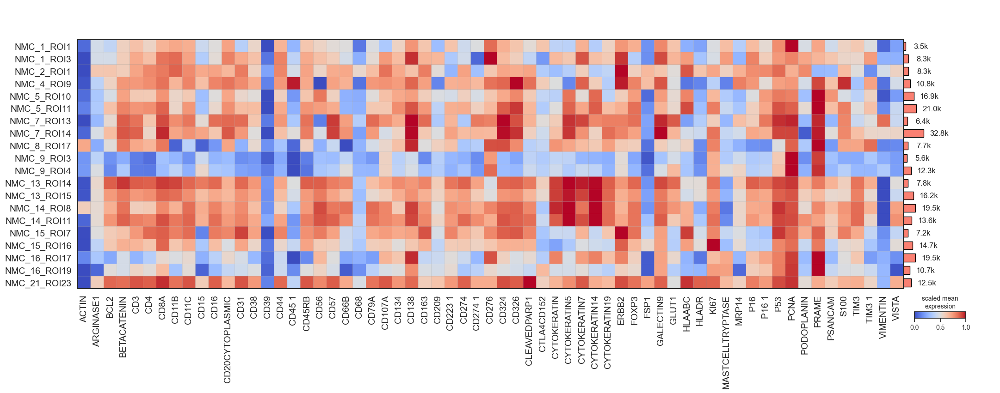

In [105]:
from scipy import sparse

adata_unified_test = adata_unified.copy()
adata_unified_test.X = np.arcsinh(adata_unified_test.X / 5)

# --- Step 2. Z-score each gene *within each patient* ---
adata_scaled_list = []

for patient, adata_p in adata_unified_test.obs.groupby("patient_exp"):
    # subset this patient’s data
    adata_patient = adata_unified_test[adata_unified_test.obs["patient_exp"] == patient].copy()

    X = adata_patient.X.A if sparse.issparse(adata_patient.X) else adata_patient.X

    # compute per-gene mean and std
    mean = X.mean(axis=0)
    std = X.std(axis=0)
    std[std == 0] = 1  # avoid division by zero

    X_scaled = (X - mean) / std
    adata_patient.X = X_scaled

    adata_scaled_list.append(adata_patient)

# Merge all scaled patients back into one AnnData
adata_scaled = adata_scaled_list[0].concatenate(
    *adata_scaled_list[1:], batch_key=None
)

# --- Step 3. Now subset only tumor cells ---
adata_scaled_tumor = adata_scaled[adata_scaled.obs["cell_type"] == "Tumor_cells"].copy()


fig = sc.pl.matrixplot(
adata_scaled_tumor, 
var_names=adata_scaled_tumor.var_names, 
groupby='patient_exp', 
cmap="coolwarm",
standard_scale="group",
use_raw=False,
show=False,
return_fig=True,
)


adata_select 

fig.add_totals()
axes = fig.get_axes()
ax = axes['mainplot_ax']
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)  # Full rotation control
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)  # Font size
group_ax = axes['group_extra_ax']
for text in group_ax.texts:
    text.set_fontsize(12)
    current_pos = text.get_position()
    text.set_position((current_pos[0] + 14, current_pos[1] +1.5 ))
cax = axes['color_legend_ax']
cax.set_title('scaled mean\nexpression', fontsize=10)
cax_current_pos = cax.get_position()
cax.set_position((cax_current_pos.x0 - 0.025, cax_current_pos.y0 - 0.08, cax_current_pos.width, cax_current_pos.height))
fig = axes['mainplot_ax'].figure
fig.tight_layout()
plt.tight_layout()


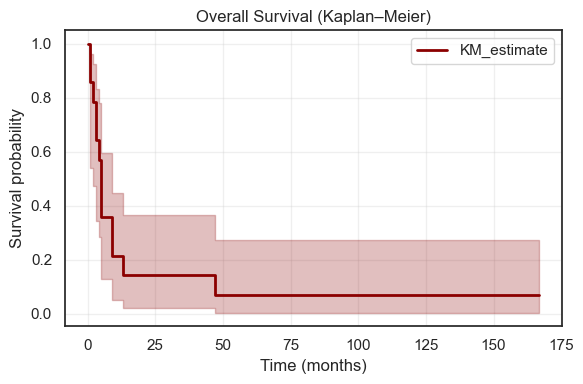

In [90]:
from lifelines import KaplanMeierFitter

time_col = "survival_time_months"  # or whatever your column is called
df = adata.obs[[time_col, "patient_ID"]].dropna().drop_duplicates().sort_values(by="patient_ID")
df["event"] = np.where(df["patient_ID"] == "NMC_1", 0, 1)
kmf = KaplanMeierFitter()

# Fit the model and plot
kmf.fit(df[time_col], event_observed=df["event"])
plt.figure(figsize=(6, 4))
kmf.plot(ci_show=True, color="darkred", linewidth=2)
plt.title("Overall Survival (Kaplan–Meier)")
plt.xlabel("Time (months)")
plt.ylabel("Survival probability")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:967: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:967: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:967: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/Users/jaw

<Figure size 600x400 with 0 Axes>

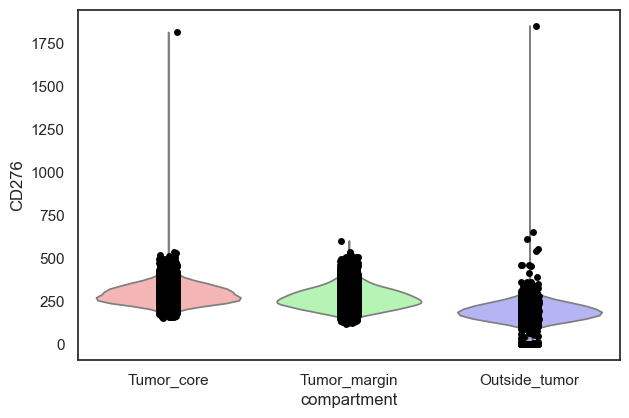

<Figure size 600x400 with 0 Axes>

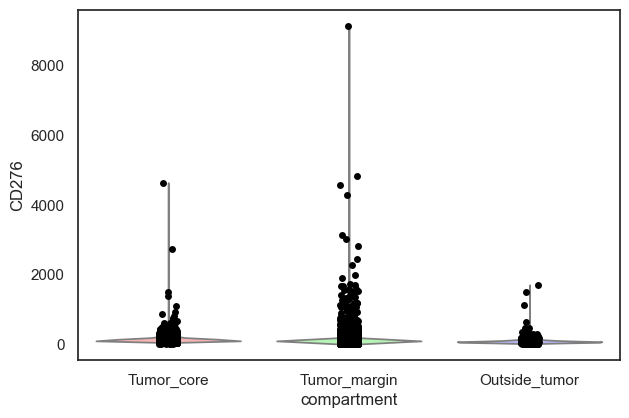

<Figure size 600x400 with 0 Axes>

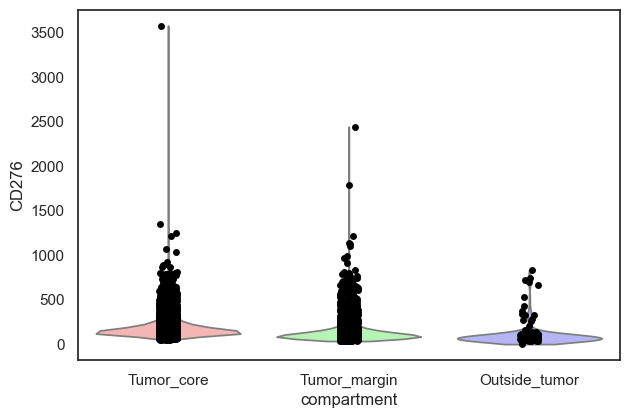

<Figure size 600x400 with 0 Axes>

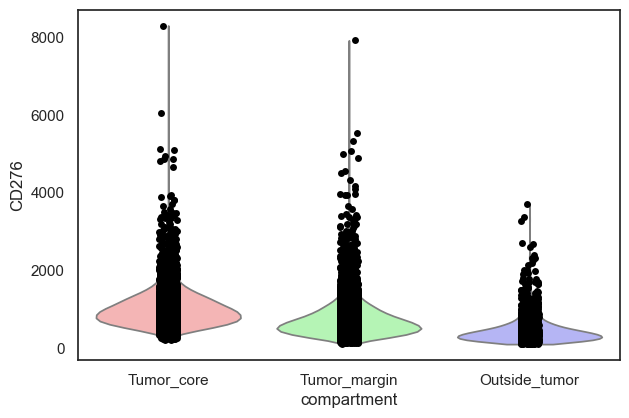

<Figure size 600x400 with 0 Axes>

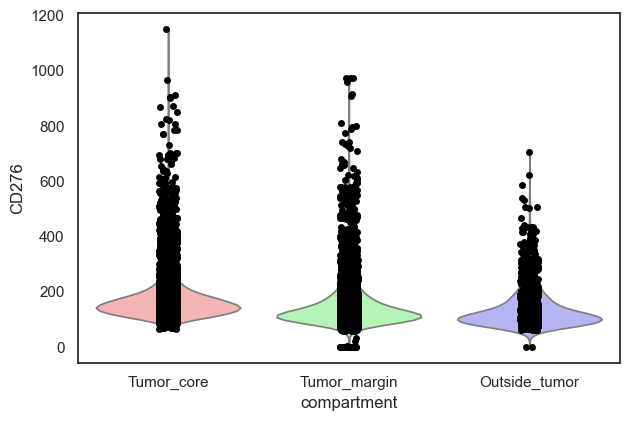

<Figure size 600x400 with 0 Axes>

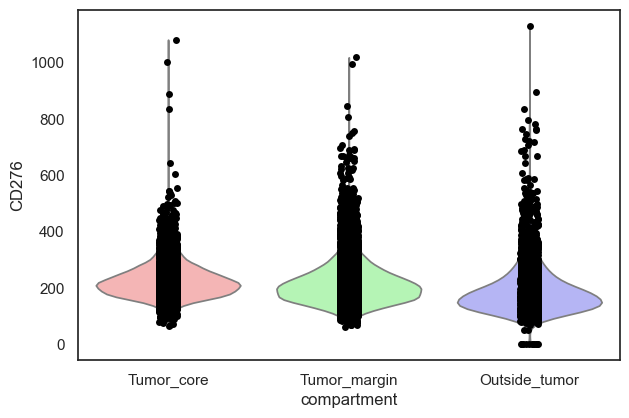

<Figure size 600x400 with 0 Axes>

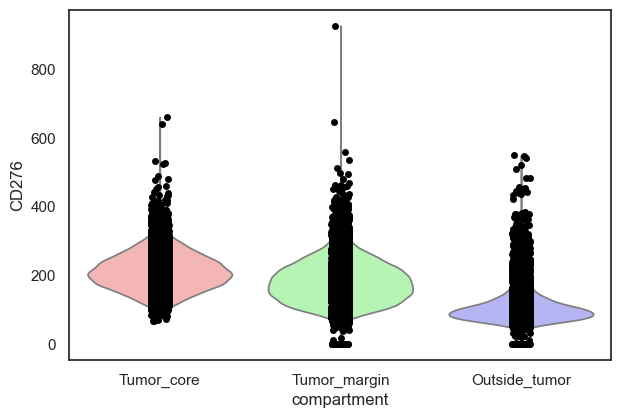

<Figure size 600x400 with 0 Axes>

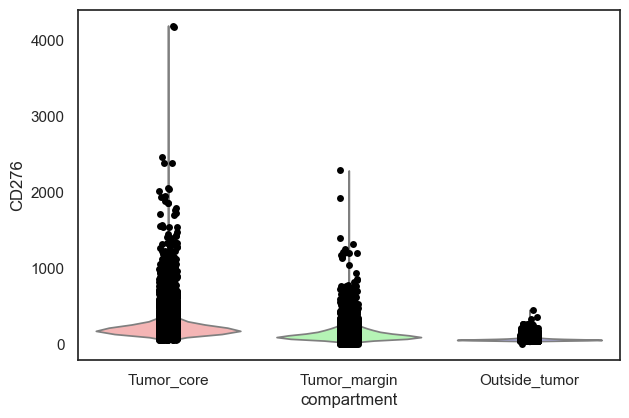

<Figure size 600x400 with 0 Axes>

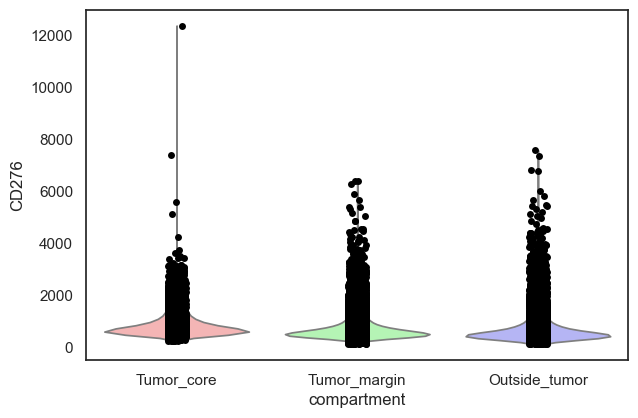

<Figure size 600x400 with 0 Axes>

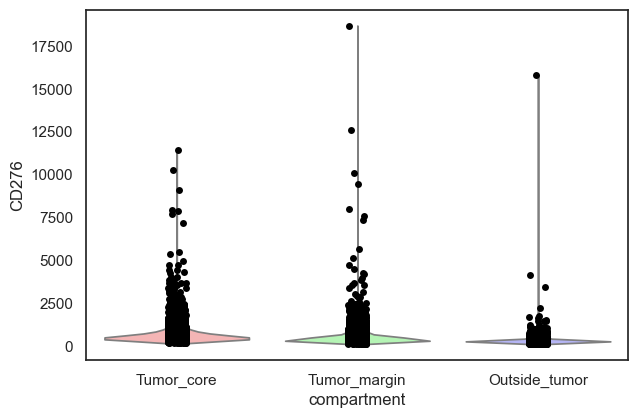

<Figure size 600x400 with 0 Axes>

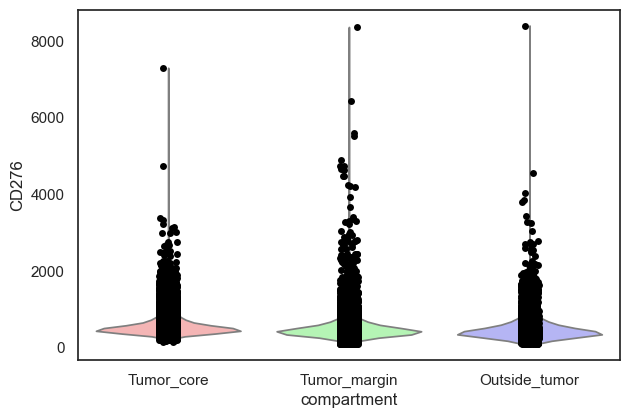

<Figure size 600x400 with 0 Axes>

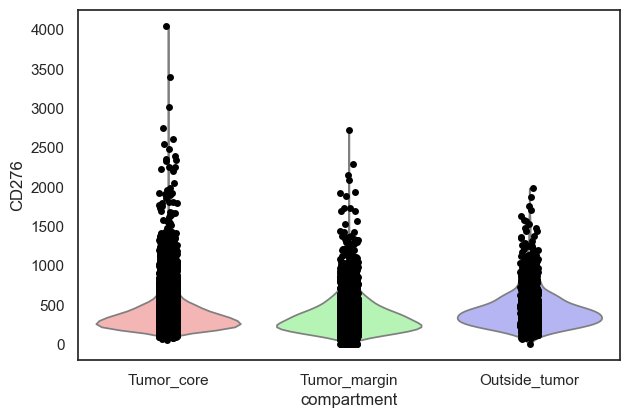

<Figure size 600x400 with 0 Axes>

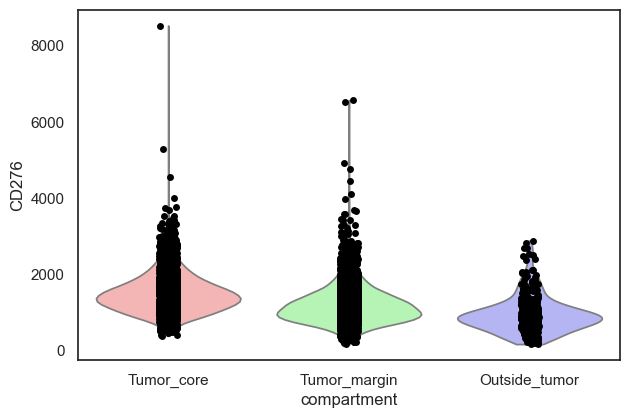

<Figure size 600x400 with 0 Axes>

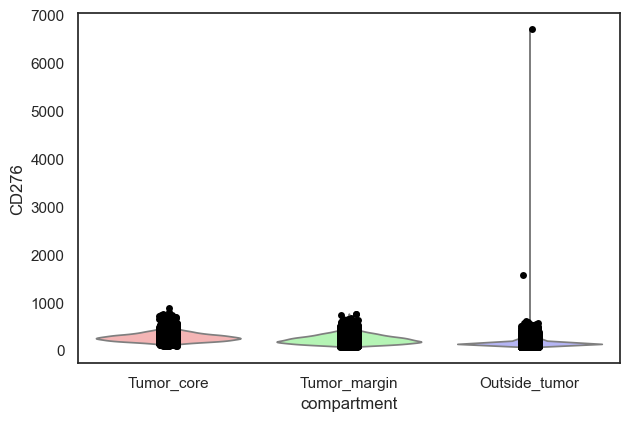

<Figure size 600x400 with 0 Axes>

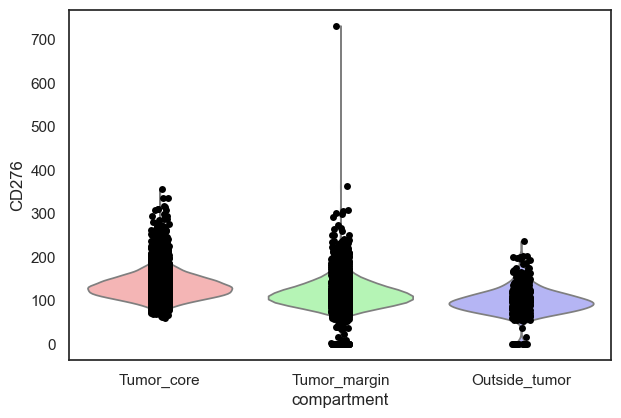

<Figure size 600x400 with 0 Axes>

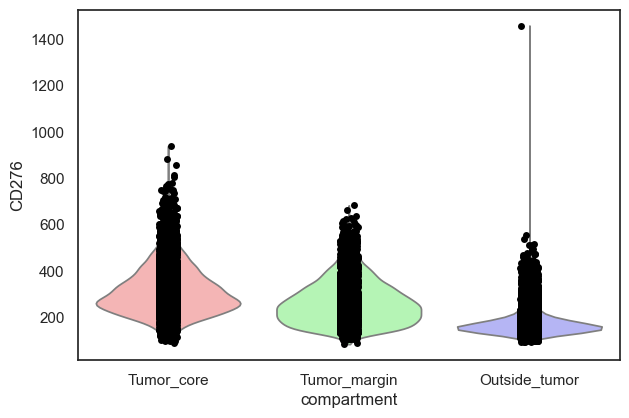

<Figure size 600x400 with 0 Axes>

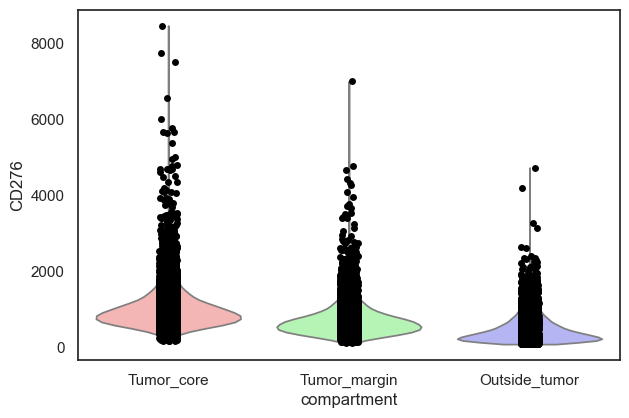

<Figure size 600x400 with 0 Axes>

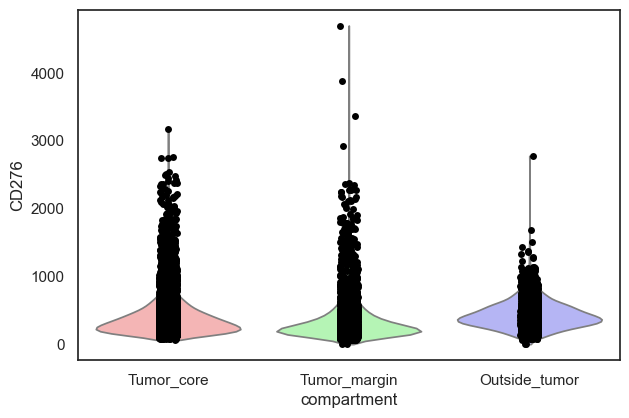

<Figure size 600x400 with 0 Axes>

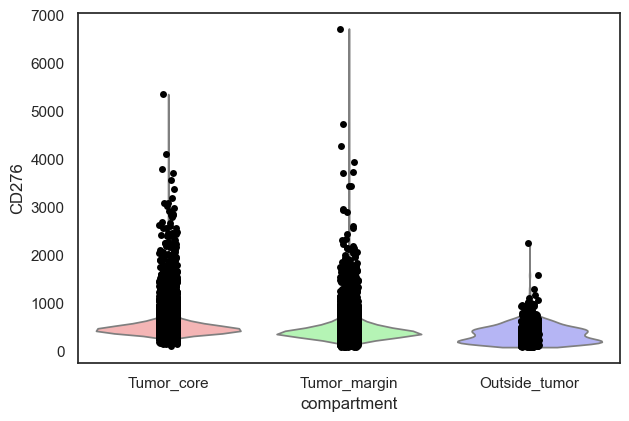

<Figure size 600x400 with 0 Axes>

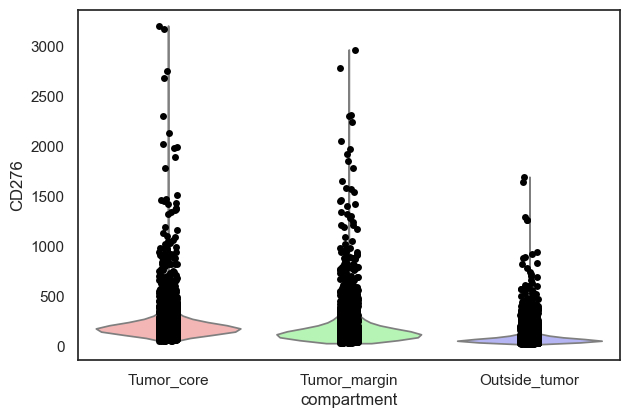

In [103]:
for patient_exp in adata_unified.obs.patient_exp.unique():
    adata_select = adata_unified[adata_unified.obs.patient_exp == patient_exp].copy()
    #make a boxplot per patient for CD276 per compartment
    plt.figure(figsize=(6,4))
    sc.pl.violin(
        adata_select,
        keys="CD276",
        groupby="compartment",
        order=["Tumor_core", "Tumor_margin", "Outside_tumor"],
        jitter=0.05,
        size=5,
        palette=['#FFAAAA', '#AAFFAA', '#AAAAFF'],
        show=False
    )

In [12]:
#let's take example of one sample...
adata_unified = sc.read_h5ad(results_dir/'adata_unified.h5ad')
adata_unified.X = np.arcsinh(adata_unified.X / 5)
adata_unified_normalized = sc.read_h5ad(results_dir/'adata_unified_normalized.h5ad')
adata_unified_normalized.X = np.arcsinh(adata_unified_normalized.X / 5)

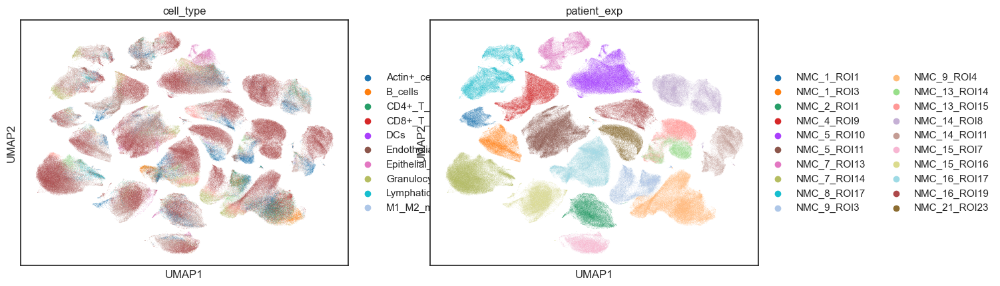

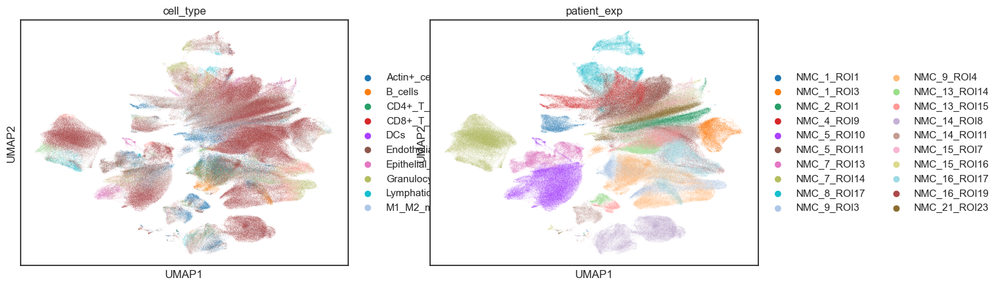

In [13]:
sc.tl.pca(adata_unified, n_comps=20)
sc.pp.neighbors(adata_unified, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata_unified)
sc.pl.umap(adata_unified, color=['cell_type', 'patient_exp'])
sc.tl.pca(adata_unified_normalized, n_comps=20)
sc.pp.neighbors(adata_unified_normalized, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata_unified_normalized)
sc.pl.umap(adata_unified_normalized, color=['cell_type', 'patient_exp'])